# Visualise results
This requires an active agent to get best action per given state.

In [31]:
!pip install seaborn --quiet
import seaborn as sns
from collections import defaultdict
from matplotlib.patches import Patch

class Visualiser:
  def __init__(self, agent):
    ALL_POSSIBLE_OBSERVATIONS = []
    for i in range(4,22):
      for j in range(1,11):
        # for k in range(0,2):
          k=0
          ALL_POSSIBLE_OBSERVATIONS.append([i,j,k])
          if i>11:
            ALL_POSSIBLE_OBSERVATIONS.append([i,j,k+1])
    ALL_POSSIBLE_OBSERVATIONS = np.array(ALL_POSSIBLE_OBSERVATIONS,dtype=np.float32)
    # state = torch.from_numpy(observation).unsqueeze(0).to(agent.policy_net.device)
    # with torch.no_grad():
    #   actions = self.policy_net.forward(state)
    # action = torch.argmax(actions).item()

    # observations, actions = [],[]
    # self.observations = np.unique(agent.state_memory, axis=0)
    self.observations = ALL_POSSIBLE_OBSERVATIONS
    # self.obs_tuples = tuple(map(tuple, np.array(observations, dtype=np.int16)))

    self.obs_tuple_dict = defaultdict(lambda: np.empty((1,2)))
    for obs in self.observations:
      state = torch.from_numpy(obs).unsqueeze(0).to(agent.policy_net.device)
      with torch.no_grad():
        actions = agent.policy_net.forward(state)
      # action = torch.argmax(actions).item()
      obs_tuple = tuple(np.array(obs, dtype=np.int8))
      # This makes sure the Visualiser works with the Duelling DDQN approach
      if type(actions) is tuple:
        V = actions[0]
        A = actions[1]
        actions = torch.add(V, (A - A.mean(dim=1, keepdim=True)))
        # q_next = torch.add(V_s_, (A_s_ - A_s_.mean(dim=1, keepdim=True)))
      self.obs_tuple_dict[obs_tuple] = actions.cpu().numpy()

  def create_grids(self, usable_ace=True):
    """Create value and policy grid given an agent."""
    # convert our state-action values to state values
    # and build a policy dictionary that maps observations to actions
    state_value = defaultdict(float)
    policy = defaultdict(int)
    for obs, action_values in self.obs_tuple_dict.items():
        state_value[obs] = float(np.max(action_values))
        policy[obs] = int(np.argmax(action_values))

    player_count, dealer_count = np.meshgrid(
        # players count, dealers face-up card
        np.arange(12, 22),
        np.arange(1, 11),
    )

    # create the value grid for plotting
    value = np.apply_along_axis(
        lambda obs: state_value[(obs[0], obs[1], usable_ace)],
        axis=2,
        arr=np.dstack([player_count, dealer_count]),
    )
    value_grid = player_count, dealer_count, value

    # create the policy grid for plotting
    policy_grid = np.apply_along_axis(
        lambda obs: policy[(obs[0], obs[1], usable_ace)],
        axis=2,
        arr=np.dstack([player_count, dealer_count]),
    )
    return value_grid, policy_grid


  def create_plots(self,value_grid, policy_grid, title: str):
    """Creates a plot using a value and policy grid."""
    # create a new figure with 2 subplots (left: state values, right: policy)
    player_count, dealer_count, value = value_grid
    fig = plt.figure(figsize=plt.figaspect(0.4))
    fig.suptitle(title, fontsize=16)

    # plot the state values
    ax1 = fig.add_subplot(1, 2, 1, projection="3d")
    ax1.plot_surface(
        player_count,
        dealer_count,
        value,
        rstride=1,
        cstride=1,
        cmap="viridis",
        edgecolor="none",
    )
    plt.xticks(range(12, 22), range(12, 22))
    plt.yticks(range(1, 11), ["A"] + list(range(2, 11)))
    ax1.set_title(f"State values")
    ax1.set_xlabel("Player sum")
    ax1.set_ylabel("Dealer showing")
    ax1.zaxis.set_rotate_label(False)
    ax1.set_zlabel("Value", fontsize=14, rotation=90)
    ax1.view_init(20, 220)

    # plot the policy
    fig.add_subplot(1, 2, 2)
    ax2 = sns.heatmap(policy_grid, linewidth=0, annot=True, cmap="Accent_r", cbar=False)
    ax2.set_title(f"Policy")
    ax2.set_xlabel("Player sum")
    ax2.set_ylabel("Dealer showing")
    ax2.set_xticklabels(range(12, 22))
    ax2.set_yticklabels(["A"] + list(range(2, 11)), fontsize=12)

    # add a legend
    legend_elements = [
        Patch(facecolor="lightgreen", edgecolor="black", label="Hit"),
        Patch(facecolor="grey", edgecolor="black", label="Stick"),
    ]
    ax2.legend(handles=legend_elements, bbox_to_anchor=(1.3, 1))
    return fig

  def run(self, title=None, usable_ace=True):
    # state values & policy with usable ace (ace counts as 11)
    value_grid, policy_grid = self.create_grids(usable_ace)
    title = 'Agent behavior' if title is None else title
    title += ' (with usable ace)' if usable_ace else ' (without usable ace)'
    fig1 = self.create_plots(value_grid, policy_grid, title=title)
    plt.show()


# Important functions for output

In [32]:
def print_stats(scores):
  n_scores = len(scores)
  wins,draws,losses = 0, 0, 0
  for score in scores:
    if score > 0:
      wins +=1
    elif score == 0:
      draws +=1
    else:
      losses +=1

  print('Statistics:',
        'wins: %.2f' % (wins/n_scores),
        'draws: %.2f' % (draws/n_scores),
        'losses: %.2f' % (losses/n_scores),)
  return wins/n_scores, draws/n_scores, losses/n_scores


def plot_learning(x, mean_scores, std_scores,
                  mean_episode_lengths, std_episode_lengths,
                  stats, title, total_time, eps_history=None):
  mean_scores = np.array(mean_scores)
  std_scores = np.array(std_scores)
  std_episode_lengths = np.array(std_episode_lengths)
  mean_episode_lengths = np.array(mean_episode_lengths)
  plt.figure(1, (12, 7), dpi=600)
  plt.title(title)
  # plt.plot(x, scores, label='scores')
  plt.plot(x, mean_scores, label=f'Mean scores')
  plt.fill_between(x, mean_scores - std_scores, mean_scores + std_scores, alpha=.4)
  plt.plot(x, mean_episode_lengths, label=f'Average episode length')
  plt.fill_between(x, mean_episode_lengths-std_episode_lengths,mean_episode_lengths+std_episode_lengths, alpha=.4)
  if eps_history is not None:
    plt.plot(x, eps_history, label='epsilon history')
  plt.plot([], [], ' ', label=f'Total time: {total_time:.2f} seconds\nW:{stats[0]:.2f}/D:{stats[1]:.2f}/L:{stats[2]:.2f}')
  plt.legend(loc='upper right')
  plt.grid()
  plt.show();

# Deep Q Network

Great resource: [Logic](https://github.com/philtabor/Youtube-Code-Repository/blob/master/ReinforcementLearning/DeepQLearning/simple_dqn_torch_2020.py) and [main](https://github.com/philtabor/Youtube-Code-Repository/blob/master/ReinforcementLearning/DeepQLearning/main_torch_dqn_lunar_lander_2020.py) by [Phil Tabor](https://github.com/philtabor/)

Let's approach the problem of Deep Reinforcement Learning.

We will use different techniques, starting with the classical Deep Q Learning, and moving towards more efficient ones such as Actor-Critic, DDQN etc.

### Definitions

In [95]:
!pip install gymnasium --quiet
import gymnasium as gym
import numpy as np
import time
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np

class DQN(nn.Module):
  def __init__(self, lr, input_dims, n_actions):
    super(DQN, self).__init__()
    self.input_dims = input_dims
    self.n_actions = n_actions
    hidden_dims = 64
    self.fc1 = nn.Linear(*self.input_dims, hidden_dims)
    self.fc2 = nn.Linear(hidden_dims, hidden_dims)
    self.fc3 = nn.Linear(hidden_dims, self.n_actions)

    self.optimizer = optim.AdamW(self.parameters(), lr=lr)
    self.loss = nn.MSELoss()
    self.device = torch.device('cuda:0' if torch.cuda.is_available else 'cpu')
    self.to(self.device)

  def forward(self, state):
    x = F.relu(self.fc1(state))
    x = F.relu(self.fc2(x))
    actions = self.fc3(x)
    return actions

class Agent:
  def __init__(self, gamma, epsilon, lr, input_dims, batch_size, n_actions,
               max_mem_size=100_000, eps_end=0.05, eps_dec=5e-4):
    self.gamma = gamma
    self.epsilon = epsilon
    self.eps_min = eps_end
    self.eps_dec = eps_dec
    self.lr = lr
    self.action_space = [i for i in range(n_actions)]
    self.mem_size = max_mem_size
    self.batch_size = batch_size
    self.mem_cntr = 0
    self.iter_cntr = 0
    self.replace_target = 100

    self.policy_net = DQN(lr, n_actions=n_actions, input_dims=input_dims)
    self.state_memory = np.zeros((self.mem_size, *input_dims), dtype=np.float32)
    self.new_state_memory = np.zeros((self.mem_size, *input_dims), dtype=np.float32)
    self.action_memory = np.zeros(self.mem_size, dtype=np.int32)
    self.reward_memory = np.zeros(self.mem_size, dtype=np.float32)
    self.terminal_memory = np.zeros(self.mem_size, bool)

  def store_transition(self, state, action, reward, state_, terminal):
    index = self.mem_cntr % self.mem_size
    self.state_memory[index] = [s for s in state]
    self.new_state_memory[index] = [s_ for s_ in state_]
    self.reward_memory[index] = reward
    self.action_memory[index] = action
    self.terminal_memory[index] = terminal

    self.mem_cntr += 1

  def choose_action(self, observation):

    if np.random.random() > self.epsilon:
      # exploit
      state = torch.from_numpy(observation).unsqueeze(0).to(self.policy_net.device)
      actions = self.policy_net.forward(state)
      action = torch.argmax(actions).item()
    else:
      # explore
      action = np.random.choice(self.action_space)
    return action

  def learn(self):
    if self.mem_cntr < self.batch_size:
      return

    self.policy_net.optimizer.zero_grad()

    max_mem = min(self.mem_cntr, self.mem_size)

    batch = np.random.choice(max_mem, self.batch_size, replace=False)
    batch_index = np.arange(self.batch_size, dtype=np.int32)

    state_batch = torch.tensor(self.state_memory[batch]).to(self.policy_net.device)
    new_state_batch = torch.tensor(self.new_state_memory[batch]).to(self.policy_net.device)
    action_batch = self.action_memory[batch]
    reward_batch = torch.tensor(self.reward_memory[batch]).to(self.policy_net.device)
    terminal_batch = torch.tensor(self.terminal_memory[batch]).to(self.policy_net.device)

    q_eval = self.policy_net.forward(state_batch)[batch_index, action_batch]
    q_next = self.policy_net.forward(new_state_batch)
    q_next[terminal_batch] = 0.

    q_target = reward_batch + self.gamma * torch.max(q_next, dim=1).values

    loss = self.policy_net.loss(q_target, q_eval).to(self.policy_net.device)
    loss.backward()
    self.policy_net.optimizer.step()

    self.iter_cntr += 1
    self.epsilon = self.epsilon - self.eps_dec \
      if self.epsilon > self.eps_min else self.eps_min

### Training

episode 1/10000 score -1.00 AVGscore -1.00 epsilon 1.00 time taken 0.20 ms avg episode length 1.0
episode 5001/10000 score 1.00 AVGscore -0.03 epsilon 0.05 time taken 2.55 ms avg episode length 1.5
Statistics: wins: 0.41 draws: 0.07 losses: 0.52


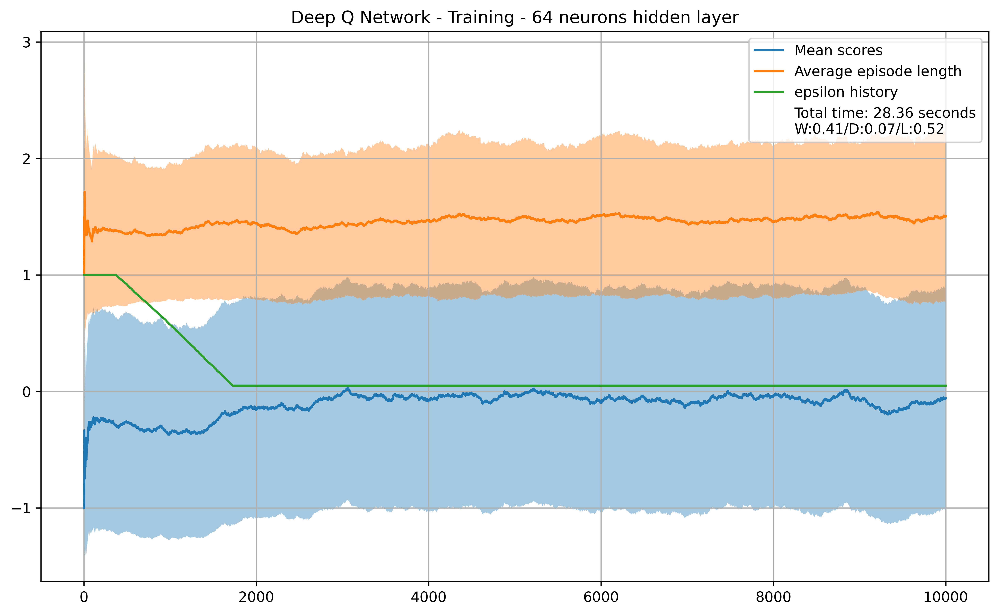

In [96]:
env = gym.make('Blackjack-v1')
GAMMA = 0.8
EPSILON = 1.0
BATCH_SIZE = 512
EPS_END = 0.05
EPS_DEC = 5e-4
LR = 1e-3
EPOCHS = 10_000
state, _ = env.reset()
n_observations = len(state)
n_actions = env.action_space.n
agent = Agent(gamma=GAMMA, epsilon=EPSILON, batch_size=BATCH_SIZE, n_actions=n_actions,
              eps_end=EPS_END, input_dims=[n_observations], lr=LR, eps_dec=EPS_DEC)
# scores, eps_history, avg_scores, episode_lengths,avg_episode_lengths = [],[],[],[],[]

scores, mean_scores, std_scores, eps_history, episode_lengths, \
mean_ep_lengths, std_ep_lengths = \
[],[],[],[],[],[],[]

start_time = time.time()
for i in range(EPOCHS):

  score = 0
  done = False
  observation, _ = env.reset()
  observation = np.array(observation, dtype=np.float32)

  epoch_start_time = time.time()
  episode_length = 0
  while not done:
    episode_length += 1
    action = agent.choose_action(observation)
    observation_, reward, terminated, truncated, info = env.step(action)
    done = terminated or truncated
    # print(observation_, reward, done, info)
    observation_ = np.array(observation_, dtype=np.float32)

    score += reward
    agent.store_transition(observation, action, reward, observation_, done)
    agent.learn()
    observation = observation_

  scores.append(score)
  eps_history.append(agent.epsilon)
  episode_lengths.append(episode_length)

  mean_ep_lengths.append(np.mean(episode_lengths[-500:]))
  std_ep_lengths.append(np.std(episode_lengths[-500:]))

  mean_scores.append(np.mean(scores[-500:]))
  std_scores.append(np.std(scores[-500:]))

  epoch_time = (time.time() - epoch_start_time) * 1000
  if i % 5000 == 0:
    print('episode %d/%d' % (i+1, EPOCHS),
          'score %.2f' % score,
          'AVGscore %.2f' % mean_scores[-1],
          'epsilon %.2f' % agent.epsilon,
          'time taken %.2f ms' % epoch_time,
          'avg episode length %.1f' % mean_ep_lengths[-1])
x = [i+1 for i in range(EPOCHS)]
total_time = (time.time() - start_time)

# plt.title('Simple DQN')
# plt.plot(x, scores, label='scores')
# plt.plot(x, eps_history, label='epsilon history')
# plt.plot(x, avg_scores, label=f'Average scores')
# plt.plot([], [], ' ', label=f'Total time: {total_time:.2f} seconds')
# plt.legend(loc='upper right')
# plt.show();
stats = print_stats(scores)
title = 'Deep Q Network - Training - 64 neurons hidden layer'
plot_learning(x, mean_scores, std_scores, mean_ep_lengths, std_ep_lengths, stats, title, total_time, eps_history)


### Testing

episode 1/1000 score -1.00 AVGscore -1.00 epsilon 0.05 time taken 1.24 ms avg episode length 2.0
Statistics: wins: 0.41 draws: 0.09 losses: 0.50


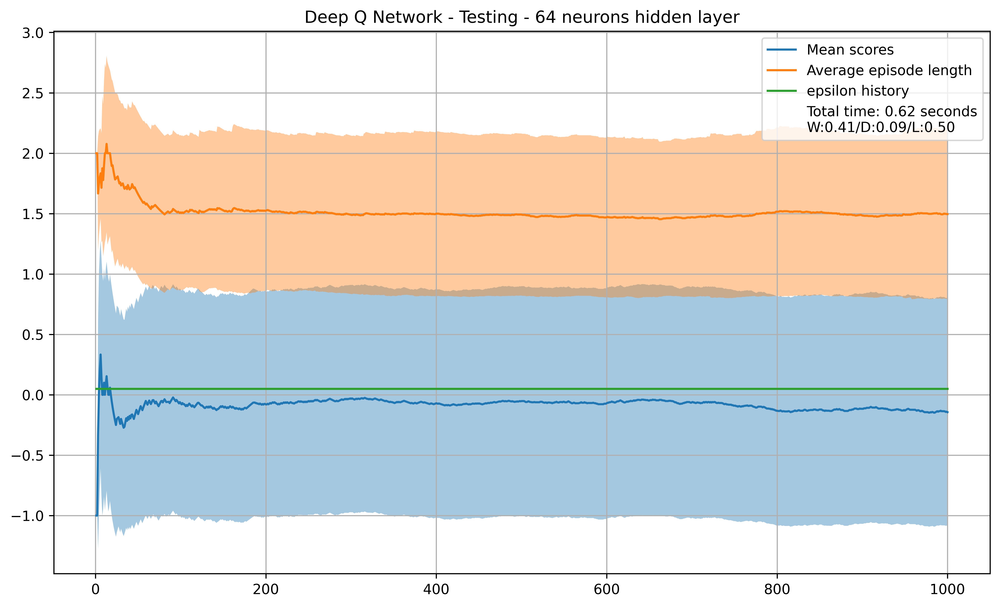

In [97]:
env = gym.make('Blackjack-v1')
GAMMA = 0.8
EPSILON = 1.0
BATCH_SIZE = 512
EPS_END = 0.05
EPS_DEC = 5e-4
LR = 1e-3
EPOCHS = 1_000
state, _ = env.reset()
n_observations = len(state)
n_actions = env.action_space.n
# agent = Agent(gamma=GAMMA, epsilon=EPSILON, batch_size=BATCH_SIZE, n_actions=n_actions,
#               eps_end=EPS_END, input_dims=[n_observations], lr=LR, eps_dec=EPS_DEC)
# scores, eps_history, avg_scores, episode_lengths,avg_episode_lengths = [],[],[],[],[]

scores, mean_scores, std_scores, eps_history, episode_lengths, \
mean_ep_lengths, std_ep_lengths = \
[],[],[],[],[],[],[]

start_time = time.time()
for i in range(EPOCHS):

  score = 0
  done = False
  observation, _ = env.reset()
  observation = np.array(observation, dtype=np.float32)

  epoch_start_time = time.time()
  episode_length = 0
  while not done:
    episode_length += 1
    action = agent.choose_action(observation)
    observation_, reward, terminated, truncated, info = env.step(action)
    done = terminated or truncated
    # print(observation_, reward, done, info)
    observation_ = np.array(observation_, dtype=np.float32)

    score += reward
    # agent.store_transition(observation, action, reward, observation_, done)
    # agent.learn()
    observation = observation_

  scores.append(score)
  eps_history.append(agent.epsilon)
  episode_lengths.append(episode_length)

  mean_ep_lengths.append(np.mean(episode_lengths[-500:]))
  std_ep_lengths.append(np.std(episode_lengths[-500:]))

  mean_scores.append(np.mean(scores[-500:]))
  std_scores.append(np.std(scores[-500:]))

  epoch_time = (time.time() - epoch_start_time) * 1000
  if i % 5000 == 0:
    print('episode %d/%d' % (i+1, EPOCHS),
          'score %.2f' % score,
          'AVGscore %.2f' % mean_scores[-1],
          'epsilon %.2f' % agent.epsilon,
          'time taken %.2f ms' % epoch_time,
          'avg episode length %.1f' % mean_ep_lengths[-1])
x = [i+1 for i in range(EPOCHS)]
total_time = (time.time() - start_time)

# plt.title('Simple DQN')
# plt.plot(x, scores, label='scores')
# plt.plot(x, eps_history, label='epsilon history')
# plt.plot(x, avg_scores, label=f'Average scores')
# plt.plot([], [], ' ', label=f'Total time: {total_time:.2f} seconds')
# plt.legend(loc='upper right')
# plt.show();
stats = print_stats(scores)
title = 'Deep Q Network - Testing - 64 neurons hidden layer'
plot_learning(x, mean_scores, std_scores, mean_ep_lengths, std_ep_lengths, stats, title, total_time, eps_history)


In [98]:
# dqn_vis = Visualiser(agent)
# dqn_vis.run('Deep Q Network agent behavior - Testing')
# dqn_vis.run('Deep Q Network agent behavior - Testing', usable_ace=False)

### Visualisation

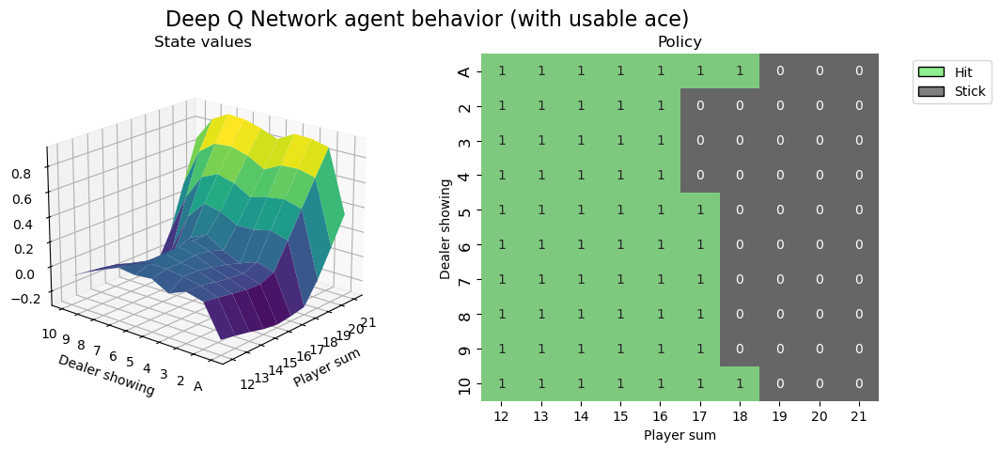

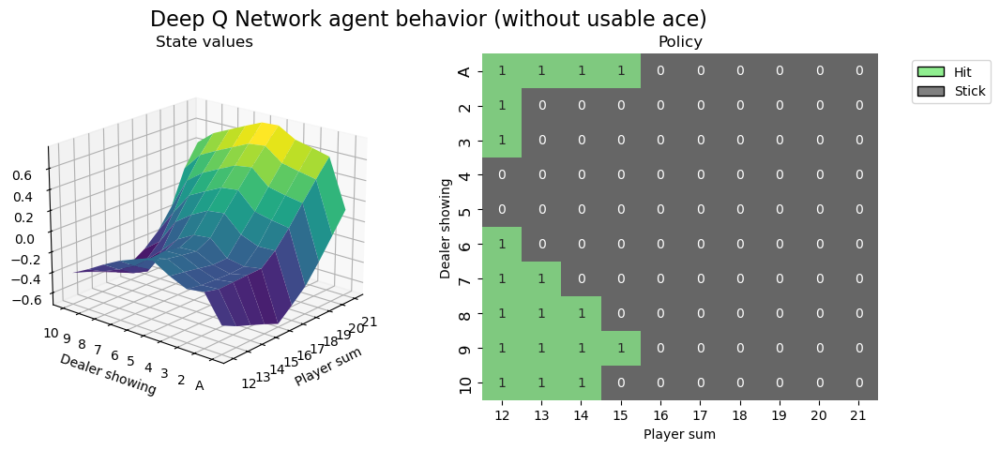

In [99]:
dqn_vis = Visualiser(agent)
dqn_vis.run('Deep Q Network agent behavior', usable_ace=True)
dqn_vis.run('Deep Q Network agent behavior', usable_ace=False)

### Random games

episode 1/1000 score -1.00 AVGscore -1.00 epsilon 1.00 time taken 0.19 ms avg episode length 1.0
Statistics: wins: 0.27 draws: 0.05 losses: 0.68


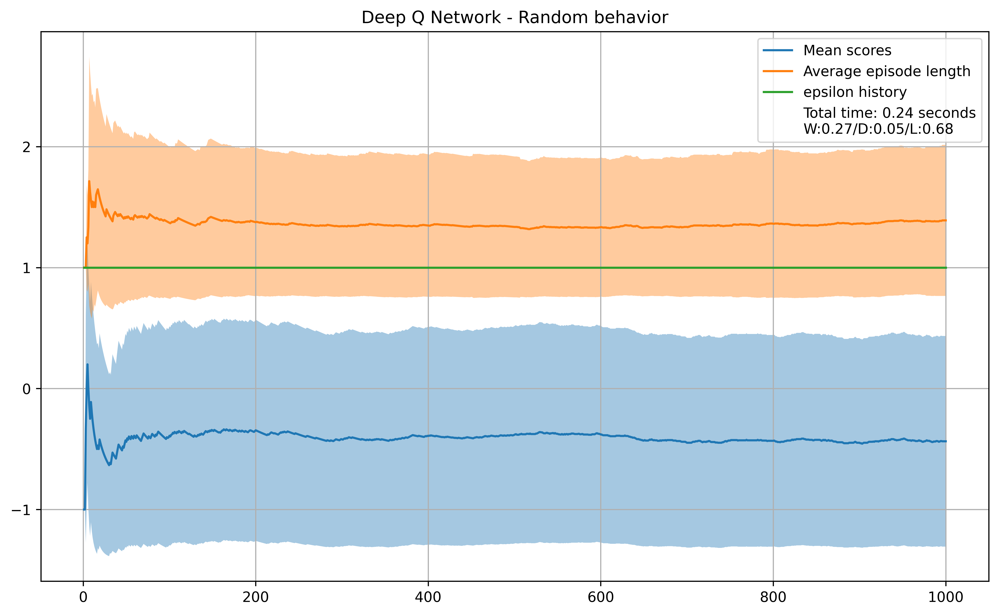

In [100]:
env = gym.make('Blackjack-v1')
GAMMA = 0.8
EPSILON = 1.0
BATCH_SIZE = 512
EPS_END = 0.05
EPS_DEC = 5e-4
LR = 1e-3
EPOCHS = 1_000
state, _ = env.reset()
n_observations = len(state)
n_actions = env.action_space.n
agent = Agent(gamma=GAMMA, epsilon=EPSILON, batch_size=BATCH_SIZE, n_actions=n_actions,
              eps_end=EPS_END, input_dims=[n_observations], lr=LR, eps_dec=0)
# scores, eps_history, avg_scores, episode_lengths,avg_episode_lengths = [],[],[],[],[]

scores, mean_scores, std_scores, eps_history, episode_lengths, \
mean_ep_lengths, std_ep_lengths = \
[],[],[],[],[],[],[]

start_time = time.time()
for i in range(EPOCHS):

  score = 0
  done = False
  observation, _ = env.reset()
  observation = np.array(observation, dtype=np.float32)

  epoch_start_time = time.time()
  episode_length = 0
  while not done:
    episode_length += 1
    action = agent.choose_action(observation)
    observation_, reward, terminated, truncated, info = env.step(action)
    done = terminated or truncated
    # print(observation_, reward, done, info)
    observation_ = np.array(observation_, dtype=np.float32)

    score += reward
    # agent.store_transition(observation, action, reward, observation_, done)
    # agent.learn()
    observation = observation_

  scores.append(score)
  eps_history.append(agent.epsilon)
  episode_lengths.append(episode_length)

  mean_ep_lengths.append(np.mean(episode_lengths[-500:]))
  std_ep_lengths.append(np.std(episode_lengths[-500:]))

  mean_scores.append(np.mean(scores[-500:]))
  std_scores.append(np.std(scores[-500:]))

  epoch_time = (time.time() - epoch_start_time) * 1000
  if i % 5000 == 0:
    print('episode %d/%d' % (i+1, EPOCHS),
          'score %.2f' % score,
          'AVGscore %.2f' % mean_scores[-1],
          'epsilon %.2f' % agent.epsilon,
          'time taken %.2f ms' % epoch_time,
          'avg episode length %.1f' % mean_ep_lengths[-1])
x = [i+1 for i in range(EPOCHS)]
total_time = (time.time() - start_time)

# plt.title('Simple DQN')
# plt.plot(x, scores, label='scores')
# plt.plot(x, eps_history, label='epsilon history')
# plt.plot(x, avg_scores, label=f'Average scores')
# plt.plot([], [], ' ', label=f'Total time: {total_time:.2f} seconds')
# plt.legend(loc='upper right')
# plt.show();
stats = print_stats(scores)
title = 'Deep Q Network - Random behavior'
plot_learning(x, mean_scores, std_scores, mean_ep_lengths, std_ep_lengths, stats, title, total_time, eps_history)


### Random games visualisations

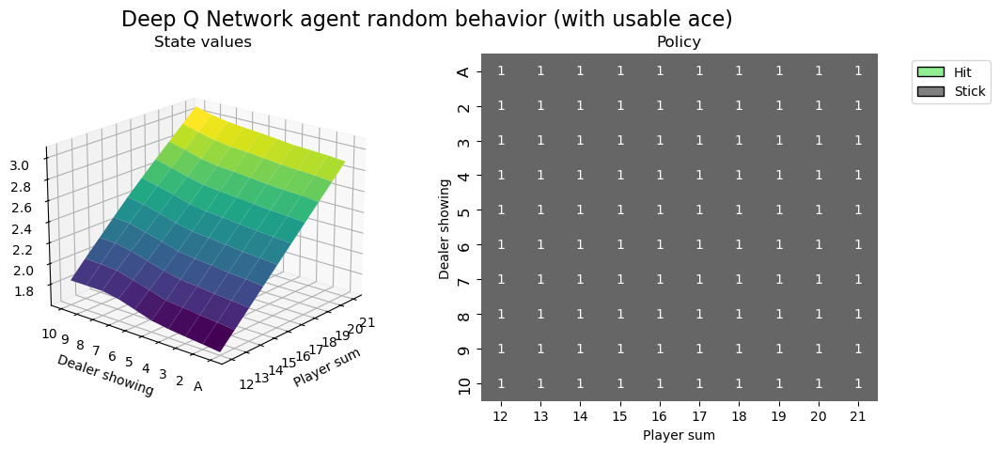

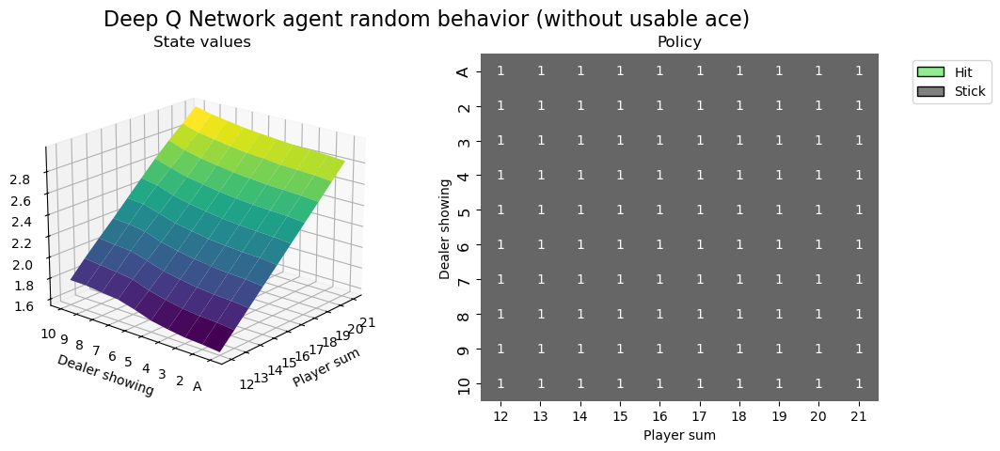

In [101]:
dqn_vis = Visualiser(agent)
dqn_vis.run('Deep Q Network agent random behavior', usable_ace=True)
dqn_vis.run('Deep Q Network agent random behavior', usable_ace=False)

# Double DQN

Great resource: [Logic](https://github.com/philtabor/Youtube-Code-Repository/blob/master/ReinforcementLearning/DeepQLearning/) and [main](https://github.com/philtabor/Youtube-Code-Repository/blob/master/ReinforcementLearning/DeepQLearning/) by [Phil Tabor](https://github.com/philtabor/)

A Double DQN approach might work better

### Definitions

In [91]:
!pip install gymnasium --quiet
import gymnasium as gym
import numpy as np
import time
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np

# COUNTER = 0 # temp for torch to numpy array conversion

class DQN(nn.Module):
  def __init__(self, lr, input_dims, n_actions):
    super(DQN, self).__init__()
    self.input_dims = input_dims
    self.n_actions = n_actions
    hidden_dims = 128
    self.fc1 = nn.Linear(*self.input_dims, hidden_dims)
    self.fc2 = nn.Linear(hidden_dims, hidden_dims)
    self.fc3 = nn.Linear(hidden_dims, self.n_actions)

    self.optimizer = optim.AdamW(self.parameters(), lr=lr)
    self.loss = nn.MSELoss()
    self.device = torch.device('cuda:0' if torch.cuda.is_available else 'cpu')
    self.to(self.device)

  def forward(self, state):
    x = F.relu(self.fc1(state))
    x = F.relu(self.fc2(x))
    actions = self.fc3(x)
    return actions

class Agent:
  def __init__(self, gamma, epsilon, lr, input_dims, batch_size, n_actions,
               tau, max_mem_size=100_000, eps_end=0.05, eps_dec=5e-4):
    self.gamma = gamma
    self.epsilon = epsilon
    self.eps_min = eps_end
    self.eps_dec = eps_dec
    self.lr = lr
    self.action_space = [i for i in range(n_actions)]
    self.mem_size = max_mem_size
    self.batch_size = batch_size
    self.mem_cntr = 0
    self.iter_cntr = 0
    self.replace_target = 100
    self.tau = tau
    self.policy_net = DQN(lr, n_actions=n_actions, input_dims=input_dims)
    self.target_net = DQN(lr, n_actions=n_actions, input_dims=input_dims)

    # Deep copy of policy network, will be updated slowly
    self.target_net.load_state_dict(self.policy_net.state_dict())
    self.state_memory = np.zeros((self.mem_size, *input_dims), dtype=np.float32)
    self.new_state_memory = np.zeros((self.mem_size, *input_dims), dtype=np.float32)
    self.action_memory = np.zeros(self.mem_size, dtype=np.int32)
    self.reward_memory = np.zeros(self.mem_size, dtype=np.float32)
    self.terminal_memory = np.zeros(self.mem_size, bool)

  def store_transition(self, state, action, reward, state_, terminal):
    index = self.mem_cntr % self.mem_size
    self.state_memory[index] = [s for s in state]
    self.new_state_memory[index] = [s_ for s_ in state_]
    self.reward_memory[index] = reward
    self.action_memory[index] = action
    self.terminal_memory[index] = terminal

    self.mem_cntr += 1

  def choose_action(self, observation):

    if np.random.random() > self.epsilon:
      # exploit
      # global COUNTER
      # COUNTER += 1
      # if COUNTER % 5000 == 0:
        # print('this', torch.tensor([observation]), 'copmared to this', torch.from_numpy(observation))
        # this tensor([[21., 10.,  1.]]) copmared to this tensor([21., 10.,  1.])
      state = torch.from_numpy(observation).unsqueeze(0).to(self.policy_net.device)
      actions = self.policy_net.forward(state)
      action = torch.argmax(actions).item()
    else:
      # explore
      action = np.random.choice(self.action_space)
    return action

  def learn(self):
    if self.mem_cntr < self.batch_size:
      return

    self.policy_net.optimizer.zero_grad()

    max_mem = min(self.mem_cntr, self.mem_size)

    batch = np.random.choice(max_mem, self.batch_size, replace=False)
    batch_index = np.arange(self.batch_size, dtype=np.int32)

    state_batch = torch.tensor(self.state_memory[batch]).to(self.policy_net.device)
    new_state_batch = torch.tensor(self.new_state_memory[batch]).to(self.policy_net.device)
    action_batch = self.action_memory[batch]
    reward_batch = torch.tensor(self.reward_memory[batch]).to(self.policy_net.device)
    terminal_batch = torch.tensor(self.terminal_memory[batch]).to(self.policy_net.device)

    q_eval = self.policy_net.forward(state_batch)[batch_index, action_batch]


    q_next = self.target_net.forward(new_state_batch)
    q_next[terminal_batch] = 0.

    q_target = reward_batch + self.gamma * torch.max(q_next, dim=1).values

    loss = self.policy_net.loss(q_target, q_eval).to(self.policy_net.device)
    loss.backward()
    nn.utils.clip_grad_value_(self.policy_net.parameters(), 100)
    self.policy_net.optimizer.step()

    target_net_state_dict = self.target_net.state_dict()
    policy_net_state_dict = self.policy_net.state_dict()
    for key in policy_net_state_dict:
      target_net_state_dict[key] = policy_net_state_dict[key] * self.tau \
      + target_net_state_dict[key]*(1-self.tau)
    self.target_net.load_state_dict(target_net_state_dict)



    self.iter_cntr += 1
    self.epsilon = self.epsilon - self.eps_dec \
      if self.epsilon > self.eps_min else self.eps_min

### Training

episode 1/10000 score -1.00 AVGscore -1.00 epsilon 1.00 time taken 0.22 ms avg episode length 1.0
episode 5001/10000 score 1.00 AVGscore -0.07 epsilon 0.01 time taken 4.57 ms avg episode length 1.5
Statistics: wins: 0.41 draws: 0.08 losses: 0.51


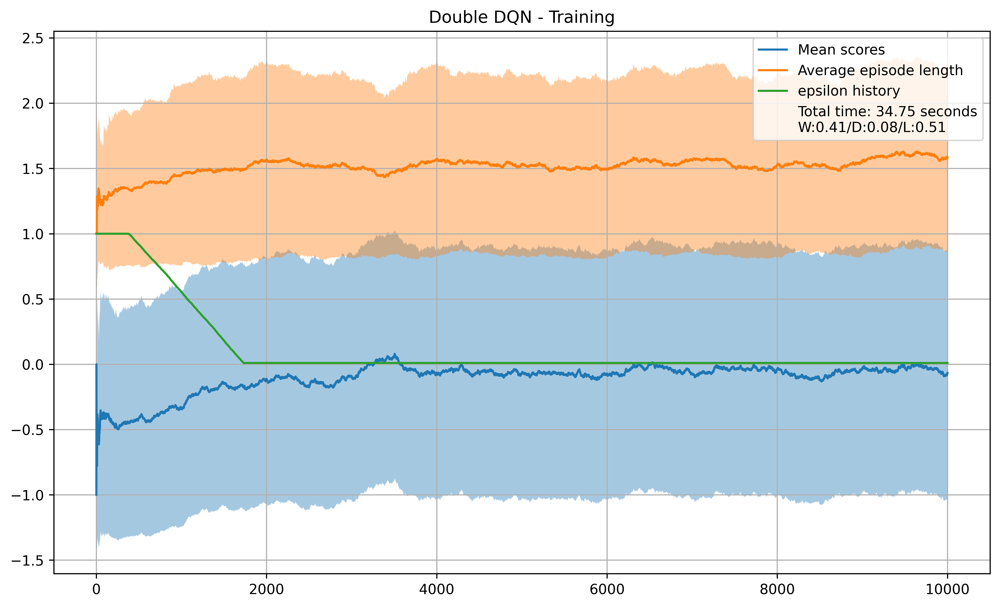

In [92]:
env = gym.make('Blackjack-v1')
GAMMA = 0.98
EPSILON = 1.0
BATCH_SIZE = 512
EPS_DEC = 5e-4
EPS_END = 0.01
LR = 1e-3
EPOCHS = 10_000
TAU = 4e-3
state, _ = env.reset()
n_observations = len(state)
n_actions = env.action_space.n
MEM_SIZE = 10_000
agent = Agent(gamma=GAMMA, epsilon=EPSILON, batch_size=BATCH_SIZE, n_actions=n_actions,
              max_mem_size=MEM_SIZE,
              eps_end=EPS_END, eps_dec=EPS_DEC, input_dims=[n_observations], lr=LR, tau=TAU)
# scores, eps_history, avg_scores, episode_lengths,avg_episode_lengths = [],[],[],[],[]

scores, mean_scores, std_scores, eps_history, episode_lengths, \
mean_ep_lengths, std_ep_lengths = \
[],[],[],[],[],[],[]

start_time = time.time()
for i in range(EPOCHS):

  score = 0
  done = False
  observation, _ = env.reset()
  observation = np.array(observation, dtype=np.float32)

  epoch_start_time = time.time()
  episode_length = 0
  while not done:
    episode_length += 1
    action = agent.choose_action(observation)
    observation_, reward, terminated, truncated, info = env.step(action)
    done = terminated or truncated
    # print(observation_, reward, done, info)
    observation_ = np.array(observation_, dtype=np.float32)

    score += reward
    agent.store_transition(observation, action, reward, observation_, done)
    agent.learn()
    observation = observation_

  scores.append(score)
  eps_history.append(agent.epsilon)
  episode_lengths.append(episode_length)

  mean_ep_lengths.append(np.mean(episode_lengths[-500:]))
  std_ep_lengths.append(np.std(episode_lengths[-500:]))

  mean_scores.append(np.mean(scores[-500:]))
  std_scores.append(np.std(scores[-500:]))

  epoch_time = (time.time() - epoch_start_time) * 1000
  if i % 5000 == 0:
    print('episode %d/%d' % (i+1, EPOCHS),
          'score %.2f' % score,
          'AVGscore %.2f' % mean_scores[-1],
          'epsilon %.2f' % agent.epsilon,
          'time taken %.2f ms' % epoch_time,
          'avg episode length %.1f' % mean_ep_lengths[-1])
x = [i+1 for i in range(EPOCHS)]
total_time = (time.time() - start_time)

stats = print_stats(scores)
title = 'Double DQN - Training'
plot_learning(x, mean_scores, std_scores, mean_ep_lengths, std_ep_lengths, stats, title, total_time, eps_history)

### Testing Double DQN

episode 1/1000 score 1.00 AVGscore 1.00 epsilon 0.01 time taken 1.37 ms avg episode length 2.0
Statistics: wins: 0.45 draws: 0.09 losses: 0.46


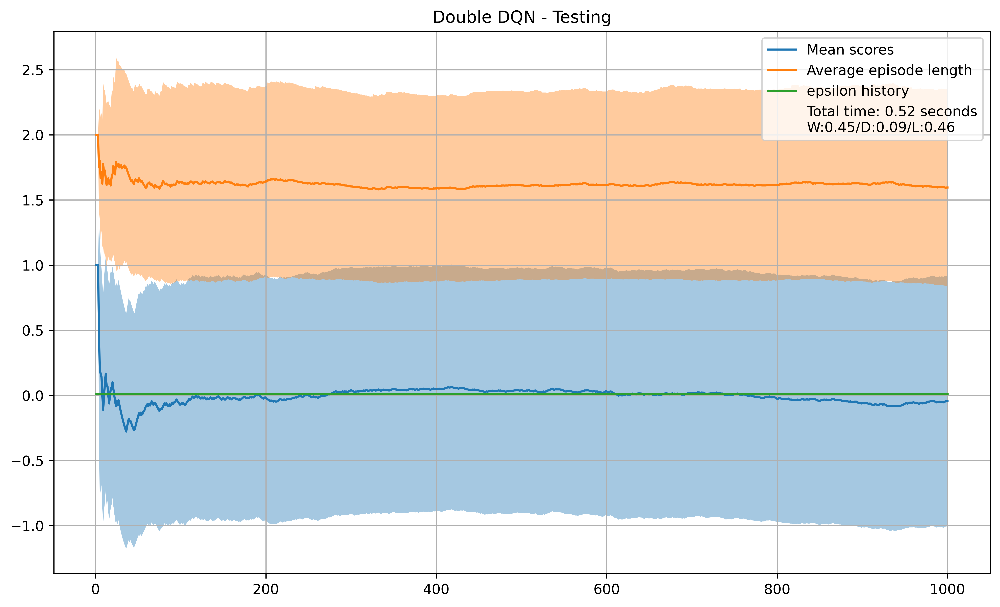

In [93]:
# Testing
env = gym.make('Blackjack-v1')
GAMMA = 0.98
EPSILON = 1.0
BATCH_SIZE = 512
EPS_DEC = 5e-4
EPS_END = 0.01
LR = 1e-3
EPOCHS = 1_000
TAU = 4e-3
state, _ = env.reset()
n_observations = len(state)
n_actions = env.action_space.n
MEM_SIZE = 10_000
# agent = Agent(gamma=GAMMA, epsilon=EPSILON, batch_size=BATCH_SIZE, n_actions=n_actions,
#               max_mem_size=MEM_SIZE,
#               eps_end=EPS_END, eps_dec=EPS_DEC, input_dims=[n_observations], lr=LR, tau=TAU)
# scores, eps_history, avg_scores, episode_lengths,avg_episode_lengths = [],[],[],[],[]

scores, mean_scores, std_scores, eps_history, episode_lengths, \
mean_ep_lengths, std_ep_lengths = \
[],[],[],[],[],[],[]

start_time = time.time()
for i in range(EPOCHS):

  score = 0
  done = False
  observation, _ = env.reset()
  observation = np.array(observation, dtype=np.float32)

  epoch_start_time = time.time()
  episode_length = 0
  while not done:
    episode_length += 1
    action = agent.choose_action(observation)
    observation_, reward, terminated, truncated, info = env.step(action)
    done = terminated or truncated
    # print(observation_, reward, done, info)
    observation_ = np.array(observation_, dtype=np.float32)

    score += reward
    # agent.store_transition(observation, action, reward, observation_, done)
    # agent.learn()
    observation = observation_

  scores.append(score)
  eps_history.append(agent.epsilon)
  episode_lengths.append(episode_length)

  mean_ep_lengths.append(np.mean(episode_lengths[-500:]))
  std_ep_lengths.append(np.std(episode_lengths[-500:]))

  mean_scores.append(np.mean(scores[-500:]))
  std_scores.append(np.std(scores[-500:]))

  epoch_time = (time.time() - epoch_start_time) * 1000
  if i % 5000 == 0:
    print('episode %d/%d' % (i+1, EPOCHS),
          'score %.2f' % score,
          'AVGscore %.2f' % mean_scores[-1],
          'epsilon %.2f' % agent.epsilon,
          'time taken %.2f ms' % epoch_time,
          'avg episode length %.1f' % mean_ep_lengths[-1])
x = [i+1 for i in range(EPOCHS)]
total_time = (time.time() - start_time)

stats = print_stats(scores)
title = 'Double DQN - Testing'
plot_learning(x, mean_scores, std_scores, mean_ep_lengths, std_ep_lengths, stats, title, total_time, eps_history)

### Visualisation

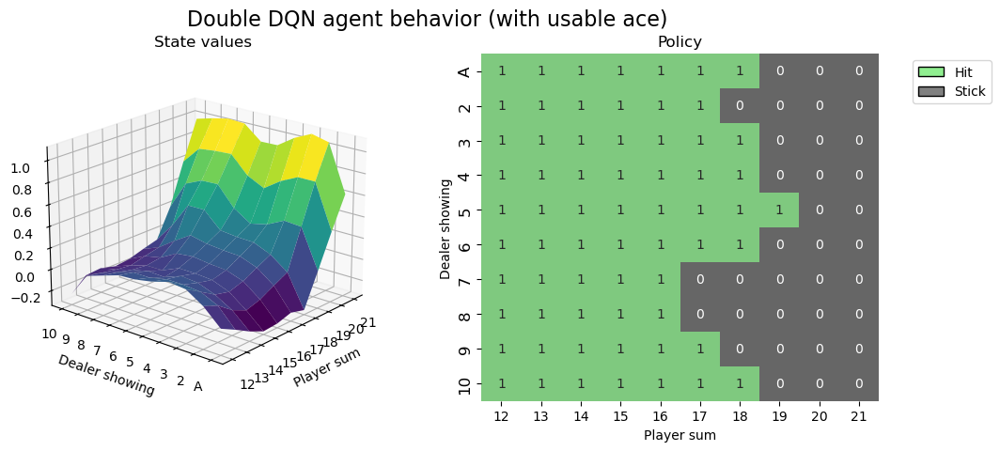

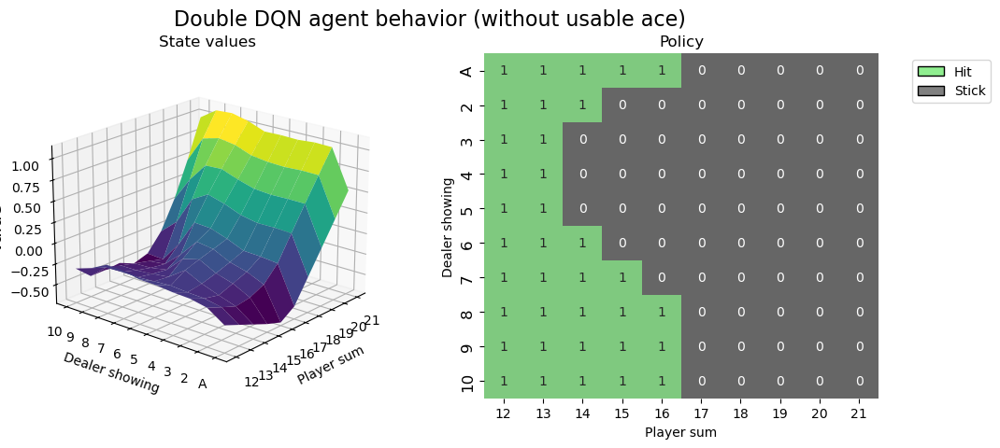

In [94]:
dqn_vis = Visualiser(agent)
dqn_vis.run('Double DQN agent behavior', usable_ace=True)
dqn_vis.run('Double DQN agent behavior', usable_ace=False)

# Duelling DQN

Great resource: [Logic](https://github.com/philtabor/Youtube-Code-Repository/blob/master/ReinforcementLearning/DeepQLearning/) and [main](https://github.com/philtabor/Youtube-Code-Repository/blob/master/ReinforcementLearning/DeepQLearning/) by [Phil Tabor](https://github.com/philtabor/)

Let's try a duelling DQN agent

#### Definitions

In [44]:
!pip install gymnasium --quiet
import gymnasium as gym
import numpy as np
import time
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np

# COUNTER = 0 # temp for torch to numpy array conversion

class DQN(nn.Module):
  def __init__(self, lr, input_dims, n_actions):
    super(DQN, self).__init__()
    self.input_dims = input_dims
    self.n_actions = n_actions
    hidden_dims = 512
    self.fc1 = nn.Linear(*self.input_dims, hidden_dims)
    self.V = nn.Linear(hidden_dims, 1)
    self.A = nn.Linear(hidden_dims, n_actions)
    # self.fc2 = nn.Linear(hidden_dims, hidden_dims)
    # self.fc3 = nn.Linear(hidden_dims, self.n_actions)

    self.optimizer = optim.AdamW(self.parameters(), lr=lr)
    self.loss = nn.MSELoss()
    self.device = torch.device('cuda:0' if torch.cuda.is_available else 'cpu')
    self.to(self.device)

  def forward(self, state):
    x = F.relu(self.fc1(state))
    V = self.V(x)
    A = self.A(x)
    return V, A

class Agent:
  def __init__(self, gamma, epsilon, lr, input_dims, batch_size, n_actions,
               max_mem_size=100_000, eps_end=0.05, eps_dec=5e-4, replace=10_000):
    self.gamma = gamma
    self.epsilon = epsilon
    self.eps_min = eps_end
    self.eps_dec = eps_dec
    self.lr = lr
    self.action_space = [i for i in range(n_actions)]
    self.mem_size = max_mem_size
    self.batch_size = batch_size
    self.mem_cntr = 0
    self.iter_cntr = 0

    self.replace_target_cnt = replace

    self.policy_net = DQN(lr, n_actions=n_actions, input_dims=input_dims)
    self.target_net = DQN(lr, n_actions=n_actions, input_dims=input_dims)

    # Deep copy of policy network, will be updated slowly
    self.target_net.load_state_dict(self.policy_net.state_dict())
    self.state_memory = np.zeros((self.mem_size, *input_dims), dtype=np.float32)
    self.new_state_memory = np.zeros((self.mem_size, *input_dims), dtype=np.float32)
    self.action_memory = np.zeros(self.mem_size, dtype=np.int32)
    self.reward_memory = np.zeros(self.mem_size, dtype=np.float32)
    self.terminal_memory = np.zeros(self.mem_size, bool)

  def replace_target_network(self):
    if self.iter_cntr % self.replace_target_cnt == 0:
      self.target_net.load_state_dict(self.policy_net.state_dict())

  def store_transition(self, state, action, reward, state_, terminal):
    index = self.mem_cntr % self.mem_size
    self.state_memory[index] = [s for s in state]
    self.new_state_memory[index] = [s_ for s_ in state_]
    self.reward_memory[index] = reward
    self.action_memory[index] = action
    self.terminal_memory[index] = terminal

    self.mem_cntr += 1

  def choose_action(self, observation):

    if np.random.random() > self.epsilon:
      # exploit
      # global COUNTER
      # COUNTER += 1
      # if COUNTER % 5000 == 0:
        # print('this', torch.tensor([observation]), 'copmared to this', torch.from_numpy(observation))
        # this tensor([[21., 10.,  1.]]) copmared to this tensor([21., 10.,  1.])
      state = torch.from_numpy(observation).unsqueeze(0).to(self.policy_net.device)
      _, advantage = self.policy_net.forward(state)
      action = torch.argmax(advantage).item()
    else:
      # explore
      action = np.random.choice(self.action_space)
    return action

  def learn(self):
    if self.mem_cntr < self.batch_size:
      return

    self.policy_net.optimizer.zero_grad()
    self.replace_target_network() # replace if necessary


    max_mem = min(self.mem_cntr, self.mem_size)

    batch = np.random.choice(max_mem, self.batch_size, replace=False)
    batch_index = np.arange(self.batch_size, dtype=np.int32)

    state_batch = torch.tensor(self.state_memory[batch]).to(self.policy_net.device)
    new_state_batch = torch.tensor(self.new_state_memory[batch]).to(self.policy_net.device)
    action_batch = self.action_memory[batch]
    reward_batch = torch.tensor(self.reward_memory[batch]).to(self.policy_net.device)
    terminal_batch = torch.tensor(self.terminal_memory[batch]).to(self.policy_net.device)

    # new code
    V_s, A_s = self.policy_net.forward(state_batch)
    V_s_, A_s_ = self.target_net.forward(new_state_batch)

    V_s_eval, A_s_eval = self.policy_net.forward(new_state_batch)

    q_pred = torch.add(V_s, (A_s - A_s.mean(dim=1, keepdim=True)))[batch_index, action_batch]
    q_next = torch.add(V_s_, (A_s_ - A_s_.mean(dim=1, keepdim=True)))

    q_eval = torch.add(V_s_eval, (A_s_eval - A_s_eval.mean(dim=1, keepdim=True)))

    max_actions = torch.argmax(q_eval, dim=1)

    q_next[terminal_batch] = 0. # nullify terminal batches
    q_target = reward_batch + self.gamma * q_next[batch_index, max_actions]


    # old code
    _old = """q_eval = self.policy_net.forward(state_batch)[batch_index, action_batch]

    q_next = self.target_net.forward(new_state_batch)
    q_next[terminal_batch] = 0.

    q_target = reward_batch + self.gamma * torch.max(q_next, dim=1).values
    """
    loss = self.policy_net.loss(q_target, q_pred).to(self.policy_net.device)
    loss.backward()

    self.policy_net.optimizer.step()


    self.iter_cntr += 1
    self.epsilon = self.epsilon - self.eps_dec \
      if self.epsilon > self.eps_min else self.eps_min

#### Training

episode 1/10000 score 1.00 AVGscore 1.00 epsilon 1.00 time taken 0.19 ms avg episode length 1.0
episode 5001/10000 score -1.00 AVGscore -0.08 epsilon 0.01 time taken 2.19 ms avg episode length 1.6
Statistics: wins: 0.40 draws: 0.08 losses: 0.52


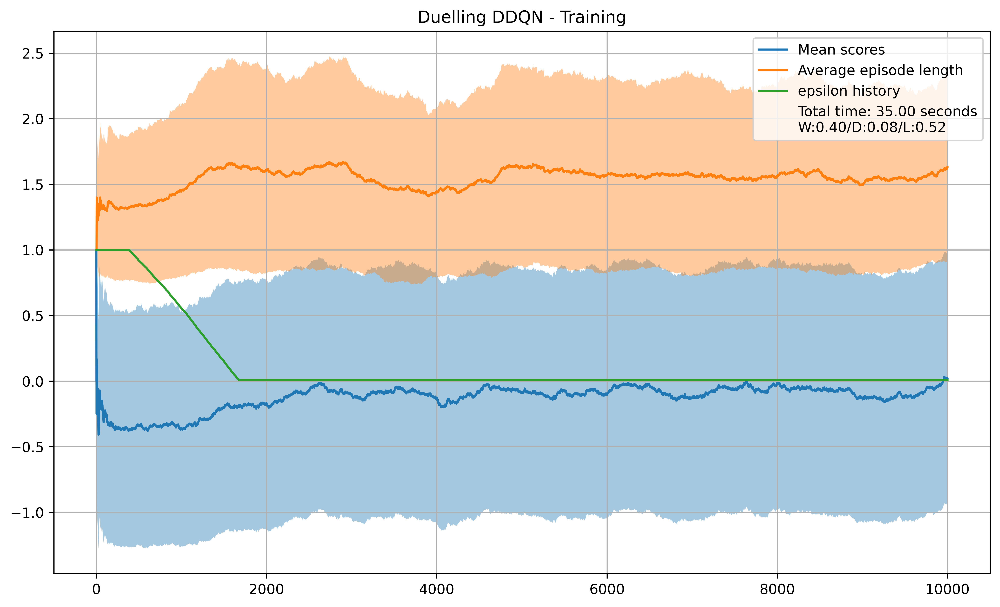

In [45]:
env = gym.make('Blackjack-v1')
GAMMA = 0.98
EPSILON = 1.0
BATCH_SIZE = 512
EPS_DEC = 5e-4
EPS_END = 0.01
LR = 1e-3
EPOCHS = 10_000
REPLACE = 2_000
state, _ = env.reset()
n_observations = len(state)
MEM_SIZE = 10_000
n_actions = env.action_space.n
agent = Agent(gamma=GAMMA, epsilon=EPSILON, batch_size=BATCH_SIZE, n_actions=n_actions,
              max_mem_size=MEM_SIZE,
              eps_end=EPS_END, eps_dec=EPS_DEC, input_dims=[n_observations], lr=LR, replace = REPLACE)
# scores, eps_history, avg_scores, episode_lengths,avg_episode_lengths = [],[],[],[],[]

scores, mean_scores, std_scores, eps_history, episode_lengths, \
mean_ep_lengths, std_ep_lengths = \
[],[],[],[],[],[],[]
start_time = time.time()
for i in range(EPOCHS):

  score = 0
  done = False
  observation, _ = env.reset()
  observation = np.array(observation, dtype=np.float32)

  epoch_start_time = time.time()
  episode_length = 0
  while not done:
    episode_length += 1
    action = agent.choose_action(observation)
    observation_, reward, terminated, truncated, info = env.step(action)
    done = terminated or truncated
    # print(observation_, reward, done, info)
    observation_ = np.array(observation_, dtype=np.float32)

    score += reward
    agent.store_transition(observation, action, reward, observation_, done)
    agent.learn()
    observation = observation_

  scores.append(score)
  eps_history.append(agent.epsilon)
  episode_lengths.append(episode_length)

  mean_ep_lengths.append(np.mean(episode_lengths[-500:]))
  std_ep_lengths.append(np.std(episode_lengths[-500:]))

  mean_scores.append(np.mean(scores[-500:]))
  std_scores.append(np.std(scores[-500:]))

  epoch_time = (time.time() - epoch_start_time) * 1000
  if i % 5000 == 0:
    print('episode %d/%d' % (i+1, EPOCHS),
          'score %.2f' % score,
          'AVGscore %.2f' % mean_scores[-1],
          'epsilon %.2f' % agent.epsilon,
          'time taken %.2f ms' % epoch_time,
          'avg episode length %.1f' % mean_ep_lengths[-1])
x = [i+1 for i in range(EPOCHS)]
total_time = (time.time() - start_time)

stats = print_stats(scores)
title = 'Duelling DDQN - Training'
plot_learning(x, mean_scores, std_scores, mean_ep_lengths, std_ep_lengths, stats, title, total_time, eps_history)

#### Testing

episode 1/1000 score 0.00 AVGscore 0.00 epsilon 0.01 time taken 1.07 ms avg episode length 2.0
Statistics: wins: 0.43 draws: 0.08 losses: 0.49


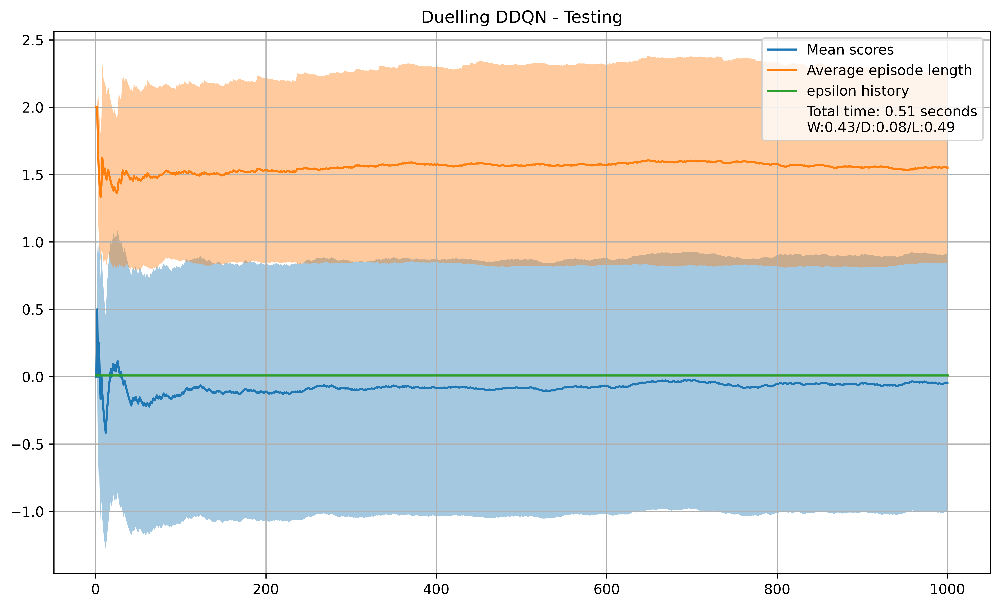

In [46]:
env = gym.make('Blackjack-v1')
GAMMA = 0.98
EPSILON = 1.0
BATCH_SIZE = 512
EPS_DEC = 5e-4
EPS_END = 0.01
LR = 1e-3
EPOCHS = 1_000
REPLACE = 2_000
state, _ = env.reset()
n_observations = len(state)
MEM_SIZE = 10_000
n_actions = env.action_space.n
# agent = Agent(gamma=GAMMA, epsilon=EPSILON, batch_size=BATCH_SIZE, n_actions=n_actions,
#               max_mem_size=MEM_SIZE,
#               eps_end=EPS_END, eps_dec=EPS_DEC, input_dims=[n_observations], lr=LR, replace = REPLACE)
# scores, eps_history, avg_scores, episode_lengths,avg_episode_lengths = [],[],[],[],[]

scores, mean_scores, std_scores, eps_history, episode_lengths, \
mean_ep_lengths, std_ep_lengths = \
[],[],[],[],[],[],[]
start_time = time.time()
for i in range(EPOCHS):

  score = 0
  done = False
  observation, _ = env.reset()
  observation = np.array(observation, dtype=np.float32)

  epoch_start_time = time.time()
  episode_length = 0
  while not done:
    episode_length += 1
    action = agent.choose_action(observation)
    observation_, reward, terminated, truncated, info = env.step(action)
    done = terminated or truncated
    # print(observation_, reward, done, info)
    observation_ = np.array(observation_, dtype=np.float32)

    score += reward
    # agent.store_transition(observation, action, reward, observation_, done)
    # agent.learn()
    observation = observation_

  scores.append(score)
  eps_history.append(agent.epsilon)
  episode_lengths.append(episode_length)

  mean_ep_lengths.append(np.mean(episode_lengths[-500:]))
  std_ep_lengths.append(np.std(episode_lengths[-500:]))

  mean_scores.append(np.mean(scores[-500:]))
  std_scores.append(np.std(scores[-500:]))

  epoch_time = (time.time() - epoch_start_time) * 1000
  if i % 5000 == 0:
    print('episode %d/%d' % (i+1, EPOCHS),
          'score %.2f' % score,
          'AVGscore %.2f' % mean_scores[-1],
          'epsilon %.2f' % agent.epsilon,
          'time taken %.2f ms' % epoch_time,
          'avg episode length %.1f' % mean_ep_lengths[-1])
x = [i+1 for i in range(EPOCHS)]
total_time = (time.time() - start_time)

stats = print_stats(scores)
title = 'Duelling DDQN - Testing'
plot_learning(x, mean_scores, std_scores, mean_ep_lengths, std_ep_lengths, stats, title, total_time, eps_history)

### Visualisations

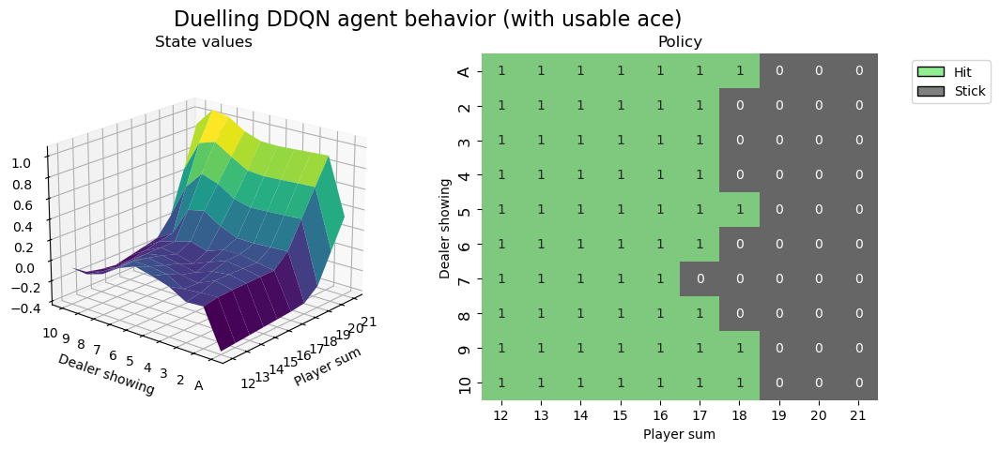

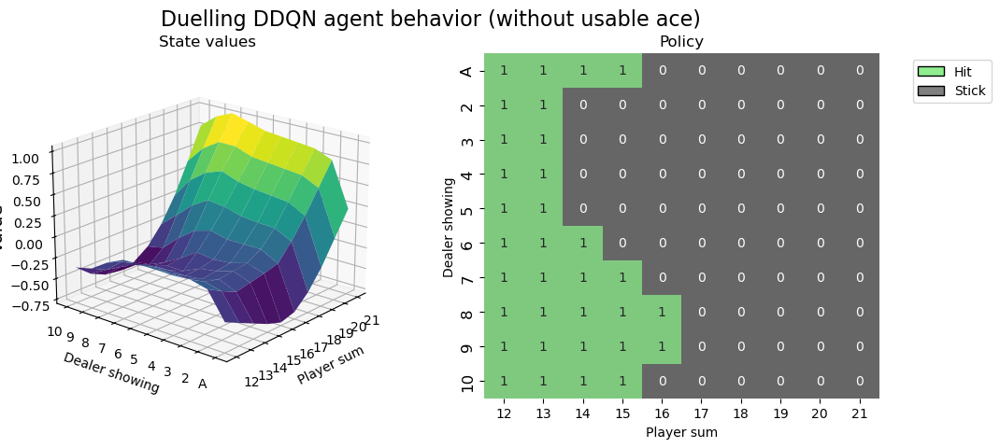

In [47]:
dqn_vis = Visualiser(agent)
dqn_vis.run('Duelling DDQN agent behavior', usable_ace=True)
dqn_vis.run('Duelling DDQN agent behavior', usable_ace=False)

# Double DQN with PER

Great resource: [Logic](https://github.com/philtabor/Youtube-Code-Repository/blob/master/ReinforcementLearning/DeepQLearning/) and [main](https://github.com/philtabor/Youtube-Code-Repository/blob/master/ReinforcementLearning/DeepQLearning/) by [Phil Tabor](https://github.com/philtabor/)

Let's try to implement Priority Experience Replay

### Sum Tree

In [85]:
# Source: https://github.com/Howuhh/prioritized_experience_replay/blob/main/memory/tree.py

# The ‘sum-tree’ data structure used here is very similar in spirit to the array representation
# of a binary heap. However, instead of the usual heap property, the value of a parent node is
# the sum of its children. Leaf nodes store the transition priorities and the internal nodes are
# intermediate sums, with the parent node containing the sum over all priorities, p_total. This
# provides a efficient way of calculating the cumulative sum of priorities, allowing O(log N) updates
# and sampling. (Appendix B.2.1, Proportional prioritization)

# Additional useful links
# Good tutorial about SumTree data structure:  https://adventuresinmachinelearning.com/sumtree-introduction-python/
# How to represent full binary tree as array: https://stackoverflow.com/questions/8256222/binary-tree-represented-using-array
class SumTree:
    def __init__(self, size):
        self.nodes = [0] * (2 * size - 1)
        self.data = [None] * size

        self.size = size
        self.count = 0
        self.real_size = 0

    @property
    def total(self):
        return self.nodes[0] # sum of all elements

    def update(self, data_idx, value):
        idx = data_idx + self.size - 1  # child index in tree array
        change = value - self.nodes[idx] # subtract the previous value

        self.nodes[idx] = value

        # walk up the tree, updating the sums
        parent = (idx - 1) // 2
        while parent >= 0:
            self.nodes[parent] += change
            parent = (parent - 1) // 2

    def add(self, value, data):
        self.data[self.count] = data # store the data
        self.update(self.count, value) # update the tree

        self.count = (self.count + 1) % self.size # increment count
        self.real_size = min(self.size, self.real_size + 1) # so we don't grow past size

    def get(self, cumsum):
        assert cumsum <= self.total

        idx = 0
        while 2 * idx + 1 < len(self.nodes):
            left, right = 2*idx + 1, 2*idx + 2

            if cumsum <= self.nodes[left]:
                idx = left
            else:
                idx = right
                cumsum = cumsum - self.nodes[left]

        data_idx = idx - self.size + 1

        return data_idx, self.nodes[idx], self.data[data_idx]

    def __repr__(self):
        return f"SumTree(nodes={self.nodes.__repr__()}, data={self.data.__repr__()})"

### Definitions

In [86]:
!pip install gymnasium --quiet
import gymnasium as gym
import numpy as np
import time
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np

# COUNTER = 0 # temp for torch to numpy array conversion

class DQN(nn.Module):
  def __init__(self, lr, input_dims, n_actions):
    super(DQN, self).__init__()
    self.input_dims = input_dims
    self.n_actions = n_actions
    hidden_dims = 128
    self.fc1 = nn.Linear(*self.input_dims, hidden_dims)
    self.fc2 = nn.Linear(hidden_dims, hidden_dims)
    self.fc3 = nn.Linear(hidden_dims, self.n_actions)

    self.optimizer = optim.AdamW(self.parameters(), lr=lr)
    self.loss = nn.MSELoss()
    self.device = torch.device('cuda:0' if torch.cuda.is_available else 'cpu')
    self.to(self.device)

  def forward(self, state):
    x = F.relu(self.fc1(state))
    x = F.relu(self.fc2(x))
    actions = self.fc3(x)
    return actions

class Agent:
  def __init__(self, gamma, epsilon, lr, input_dims, batch_size, n_actions,
               tau, memory_eps=1e-2, alpha=.7, beta=.5,
               max_mem_size=100_000, eps_end=0.05, eps_dec=5e-4):
    self.gamma = gamma
    self.epsilon = epsilon
    self.eps_min = eps_end
    self.eps_dec = eps_dec
    self.lr = lr
    self.action_space = [i for i in range(n_actions)]
    self.batch_size = batch_size
    self.iter_cntr = 0
    self.replace_target = 100
    self.tau = tau
    self.policy_net = DQN(lr, n_actions=n_actions, input_dims=input_dims)
    self.target_net = DQN(lr, n_actions=n_actions, input_dims=input_dims)

    # Deep copy of policy network, will be updated slowly
    self.target_net.load_state_dict(self.policy_net.state_dict())

    # Memory related - PER parameters
    self.memory_eps = memory_eps # minimal priority, prevents zero probabilities
    self.alpha = alpha # determines how much prioritization is used, a = 0 corresponding to the uniform case
    self.beta = beta # determines the amount of importance-sampling correction, b=1 fully compensate \
                    # for the non-uniform probabilities
    self.max_priority = memory_eps # priority for new samples, init as eps

    # transition: state, action, reward, next_state, done
    self.tree = SumTree(size=max_mem_size)
    self.mem_cntr = 0
    self.mem_size = max_mem_size

    self.state_memory = np.zeros((self.mem_size, *input_dims), dtype=np.float32)
    self.new_state_memory = np.zeros((self.mem_size, *input_dims), dtype=np.float32)
    self.action_memory = np.zeros(self.mem_size, dtype=np.int32)
    self.reward_memory = np.zeros(self.mem_size, dtype=np.float32)
    self.terminal_memory = np.zeros(self.mem_size, bool)

  def store_transition(self, state, action, reward, state_, terminal):
    index = self.mem_cntr % self.mem_size
    self.state_memory[index] = [s for s in state]
    self.new_state_memory[index] = [s_ for s_ in state_]
    self.reward_memory[index] = reward
    self.action_memory[index] = action
    self.terminal_memory[index] = terminal

    # store transition index with maximum priority in sum tree
    self.tree.add(self.max_priority, index)

    self.mem_cntr += 1

  def update_priorities(self, data_idxs, priorities):
    for data_idx, priority in zip(data_idxs, priorities):
      priority = (priority + self.memory_eps) ** self.alpha

      self.tree.update(data_idx, priority)
      self.max_priority = max(self.max_priority, priority)

  def choose_action(self, observation):
    if np.random.random() > self.epsilon:
      # exploit
      # global COUNTER
      # COUNTER += 1
      # if COUNTER % 5000 == 0:
        # print('this', torch.tensor([observation]), 'copmared to this', torch.from_numpy(observation))
        # this tensor([[21., 10.,  1.]]) copmared to this tensor([21., 10.,  1.])
      state = torch.from_numpy(observation).unsqueeze(0).to(self.policy_net.device)
      with torch.no_grad():
        actions = self.policy_net.forward(state)
      action = torch.argmax(actions).item()
    else:
      # explore
      action = np.random.choice(self.action_space)
    return action

  def learn(self, weights=None):
    if self.mem_cntr < self.batch_size:
      return

    # sample from memory - MAGIC
    max_mem = min(self.mem_cntr, self.mem_size)
    # if weights is not None:
    if True:
      sample_idxs, tree_idxs = [], []
      priorities = np.empty((self.batch_size, 1), dtype=np.float32)

      segment = self.tree.total / self.batch_size
      for i in range(self.batch_size):
        a, b = segment * i, segment * (i + 1)

        cumsum = np.random.uniform(a,b)
        # sample_idx is a sample index in buffer, needed later to sample actual transitions
        # tree_idx is an index of a sapmle in the tree, needed later to update priorities
        tree_idx, priority, sample_idx = self.tree.get(cumsum)

        priorities[i] = priority
        tree_idxs.append(tree_idx)
        sample_idxs.append(sample_idx)

      # Let's define the prob. of sampling transition i as P(i) = p_i^α / \sum_{k} p_k^α
      # where p_i > 0 is the priority of transition i (Section 3.3 of paper)
      probs = priorities / self.tree.total

      weights = (self.mem_cntr * probs) ** -self.beta
      weights = weights/weights.max() # normalization to [0,1]
      batch = sample_idxs

    # prior case
    else:
      weights = None
      # weights = torch.ones_like(q_eval)
      batch = np.random.choice(max_mem, self.batch_size, replace=False)
    state_batch = torch.tensor(self.state_memory[batch]).to(self.policy_net.device)
    new_state_batch = torch.tensor(self.new_state_memory[batch]).to(self.policy_net.device)
    action_batch = self.action_memory[batch]
    reward_batch = torch.tensor(self.reward_memory[batch]).to(self.policy_net.device)
    terminal_batch = torch.tensor(self.terminal_memory[batch]).to(self.policy_net.device)

    batch_index = np.arange(self.batch_size, dtype=np.int32)

    # train agent
    q_next = self.target_net.forward(new_state_batch)
    q_next[terminal_batch] = 0.

    q_target = reward_batch + self.gamma * torch.max(q_next, dim=1).values

    q_eval = self.policy_net.forward(state_batch)[batch_index, action_batch]

    if weights is None:
      weights = torch.ones_like(q_eval)


    # loss = self.policy_net.loss(q_target, q_eval).to(self.policy_net.device)
    self.policy_net.optimizer.zero_grad()
    td_error = torch.abs(q_eval - q_target).detach()
    weights = torch.from_numpy(weights).to(self.policy_net.device)
    loss = torch.mean((q_eval - q_target) ** 2 * weights)
    loss.backward()
    # nn.utils.clip_grad_value_(self.policy_net.parameters(), 100)
    self.policy_net.optimizer.step()

    self.update_priorities(tree_idxs, td_error.cpu().numpy())

    # soft update DDQN style
    target_net_state_dict = self.target_net.state_dict()
    policy_net_state_dict = self.policy_net.state_dict()
    for key in policy_net_state_dict:
      target_net_state_dict[key] = policy_net_state_dict[key] * self.tau \
      + target_net_state_dict[key]*(1-self.tau)
    self.target_net.load_state_dict(target_net_state_dict)

    self.iter_cntr += 1
    self.epsilon = self.epsilon - self.eps_dec \
      if self.epsilon > self.eps_min else self.eps_min

### Training

episode 1/10000 score 1.00 AVGscore 1.00 epsilon 1.00 time taken 0.29 ms avg episode length 1.0
episode 2501/10000 score 1.00 AVGscore -0.11 epsilon 0.00 time taken 16.73 ms avg episode length 1.4
episode 5001/10000 score 1.00 AVGscore -0.08 epsilon 0.00 time taken 14.82 ms avg episode length 1.5
episode 7501/10000 score 1.00 AVGscore -0.09 epsilon 0.00 time taken 5.63 ms avg episode length 1.5
Statistics: wins: 0.42 draws: 0.07 losses: 0.51


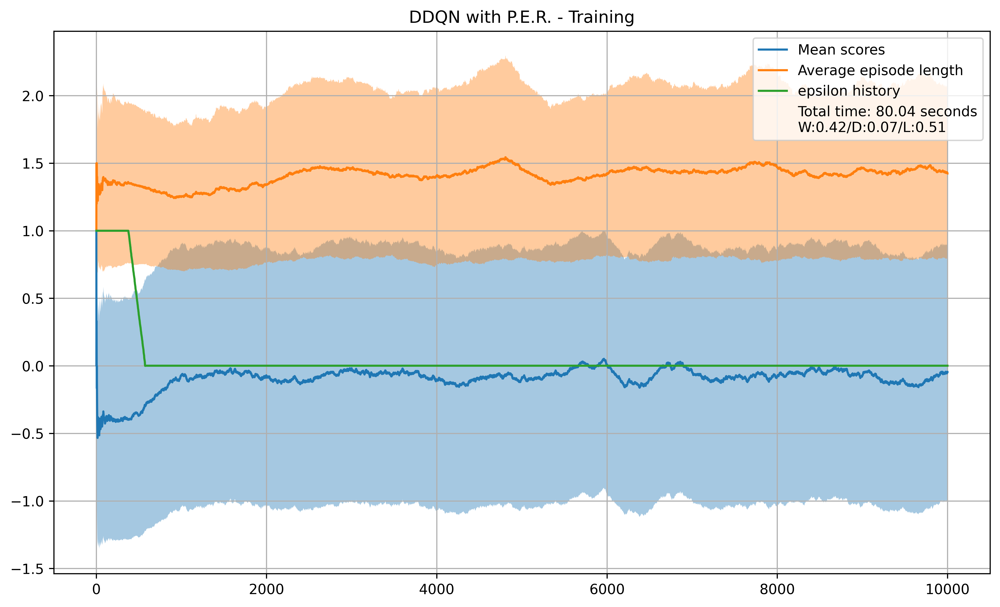

In [87]:
env = gym.make('Blackjack-v1')
GAMMA = 0.99
EPSILON = 1.0
BATCH_SIZE = 512
EPS_DEC = 4e-3
EPS_END = 1e-3
LR = 1e-3
EPOCHS = 10_000
TAU = 4e-3
MEMORY_SIZE = 10_000
# PER hyperparameters
ALPHA = .7
BETA = .4
MEMORY_EPS = 1e-2 # memory offset, to make sure everything can be sampled

state, _ = env.reset()
n_observations = len(state)
n_actions = env.action_space.n
agent = Agent(gamma=GAMMA, epsilon=EPSILON, lr=LR, tau=TAU, batch_size=BATCH_SIZE, n_actions=n_actions,
              max_mem_size=MEMORY_SIZE, alpha=ALPHA, beta=BETA, memory_eps=MEMORY_EPS,
              eps_end=EPS_END, eps_dec=EPS_DEC, input_dims=[n_observations])

"""gamma, epsilon, lr, input_dims, batch_size, n_actions,
               tau, memory_eps=1e-2, alpha=.7, beta=.4,
               max_mem_size=100_000, eps_end=0.05, eps_dec=5e-4"""

scores, mean_scores, std_scores, eps_history, episode_lengths, \
mean_ep_lengths, std_ep_lengths = \
[],[],[],[],[],[],[]

start_time = time.time()
for i in range(EPOCHS):

  score = 0
  done = False
  observation, _ = env.reset()
  observation = np.array(observation, dtype=np.float32)

  epoch_start_time = time.time()
  episode_length = 0
  while not done:
    episode_length += 1
    action = agent.choose_action(observation)
    observation_, reward, terminated, truncated, info = env.step(action)
    done = terminated or truncated
    # print(observation_, reward, done, info)
    observation_ = np.array(observation_, dtype=np.float32)

    score += reward
    agent.store_transition(observation, action, reward, observation_, done)
    agent.learn()
    observation = observation_

  scores.append(score)
  eps_history.append(agent.epsilon)
  episode_lengths.append(episode_length)

  mean_ep_lengths.append(np.mean(episode_lengths[-500:]))
  std_ep_lengths.append(np.std(episode_lengths[-500:]))

  mean_scores.append(np.mean(scores[-500:]))
  std_scores.append(np.std(scores[-500:]))

  epoch_time = (time.time() - epoch_start_time) * 1000
  if i % 2500 == 0:
    print('episode %d/%d' % (i+1, EPOCHS),
          'score %.2f' % score,
          'AVGscore %.2f' % mean_scores[-1],
          'epsilon %.2f' % agent.epsilon,
          'time taken %.2f ms' % epoch_time,
          'avg episode length %.1f' % mean_ep_lengths[-1])

stats = print_stats(scores)
x = [i+1 for i in range(EPOCHS)]
total_time = (time.time() - start_time)

# stats = print_stats(scores)
title = 'DDQN with P.E.R. - Training'
plot_learning(x, mean_scores, std_scores, mean_ep_lengths, std_ep_lengths, stats, title, total_time, eps_history)


### Testing

episode 1/1000 score -1.00 AVGscore -1.00 epsilon 0.00 time taken 16.35 ms avg episode length 1.0
Statistics: wins: 0.41 draws: 0.09 losses: 0.50


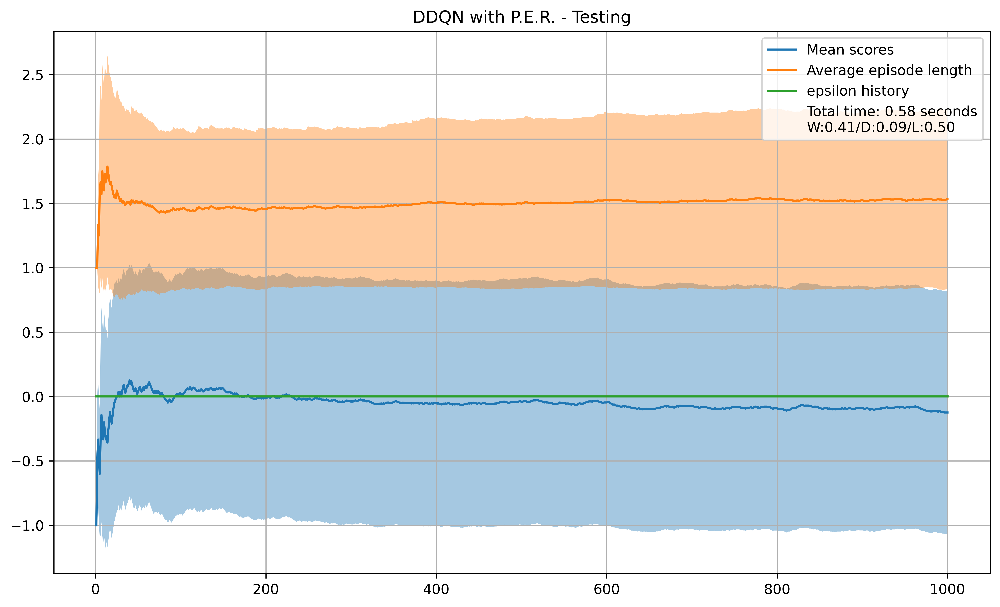

In [90]:
env = gym.make('Blackjack-v1')
GAMMA = 0.99
EPSILON = 1.0
BATCH_SIZE = 512
EPS_DEC = 4e-3
EPS_END = 1e-3
LR = 1e-3
EPOCHS = 1_000
TAU = 4e-3
MEMORY_SIZE = 1_000
# PER hyperparameters
ALPHA = .7
BETA = .4
MEMORY_EPS = 1e-2 # memory offset, to make sure everything can be sampled

state, _ = env.reset()
n_observations = len(state)
n_actions = env.action_space.n
# agent = Agent(gamma=GAMMA, epsilon=EPSILON, lr=LR, tau=TAU, batch_size=BATCH_SIZE, n_actions=n_actions,
#               max_mem_size=MEMORY_SIZE, alpha=ALPHA, beta=BETA, memory_eps=MEMORY_EPS,
#               eps_end=EPS_END, eps_dec=EPS_DEC, input_dims=[n_observations])

"""gamma, epsilon, lr, input_dims, batch_size, n_actions,
               tau, memory_eps=1e-2, alpha=.7, beta=.4,
               max_mem_size=100_000, eps_end=0.05, eps_dec=5e-4"""

scores, mean_scores, std_scores, eps_history, episode_lengths, \
mean_ep_lengths, std_ep_lengths = \
[],[],[],[],[],[],[]

start_time = time.time()
for i in range(EPOCHS):

  score = 0
  done = False
  observation, _ = env.reset()
  observation = np.array(observation, dtype=np.float32)

  epoch_start_time = time.time()
  episode_length = 0
  while not done:
    episode_length += 1
    action = agent.choose_action(observation)
    observation_, reward, terminated, truncated, info = env.step(action)
    done = terminated or truncated
    # print(observation_, reward, done, info)
    observation_ = np.array(observation_, dtype=np.float32)

    score += reward
    # agent.store_transition(observation, action, reward, observation_, done)
    # agent.learn()
    observation = observation_

  scores.append(score)
  eps_history.append(agent.epsilon)
  episode_lengths.append(episode_length)

  mean_ep_lengths.append(np.mean(episode_lengths[-500:]))
  std_ep_lengths.append(np.std(episode_lengths[-500:]))

  mean_scores.append(np.mean(scores[-500:]))
  std_scores.append(np.std(scores[-500:]))

  epoch_time = (time.time() - epoch_start_time) * 1000
  if i % 2500 == 0:
    print('episode %d/%d' % (i+1, EPOCHS),
          'score %.2f' % score,
          'AVGscore %.2f' % mean_scores[-1],
          'epsilon %.2f' % agent.epsilon,
          'time taken %.2f ms' % epoch_time,
          'avg episode length %.1f' % mean_ep_lengths[-1])

stats = print_stats(scores)
x = [i+1 for i in range(EPOCHS)]
total_time = (time.time() - start_time)

# stats = print_stats(scores)
title = 'DDQN with P.E.R. - Testing'
plot_learning(x, mean_scores, std_scores, mean_ep_lengths, std_ep_lengths, stats, title, total_time, eps_history)


### Visualisations

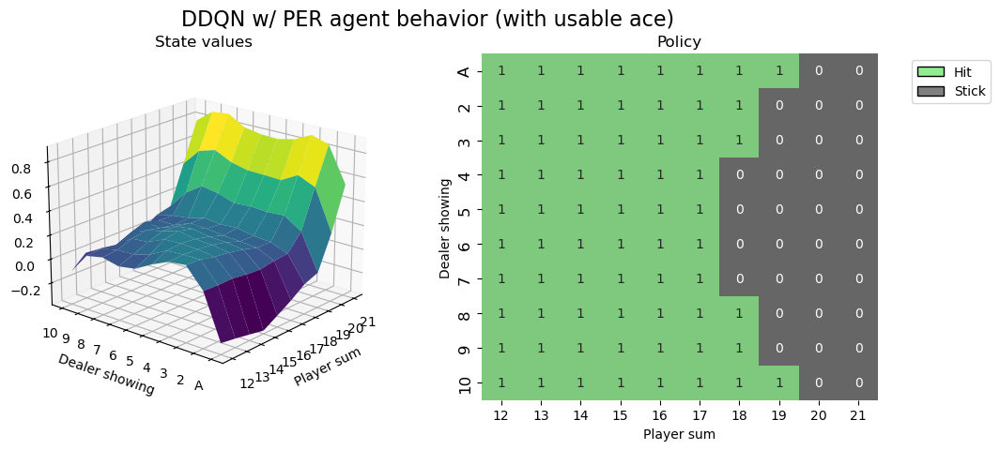

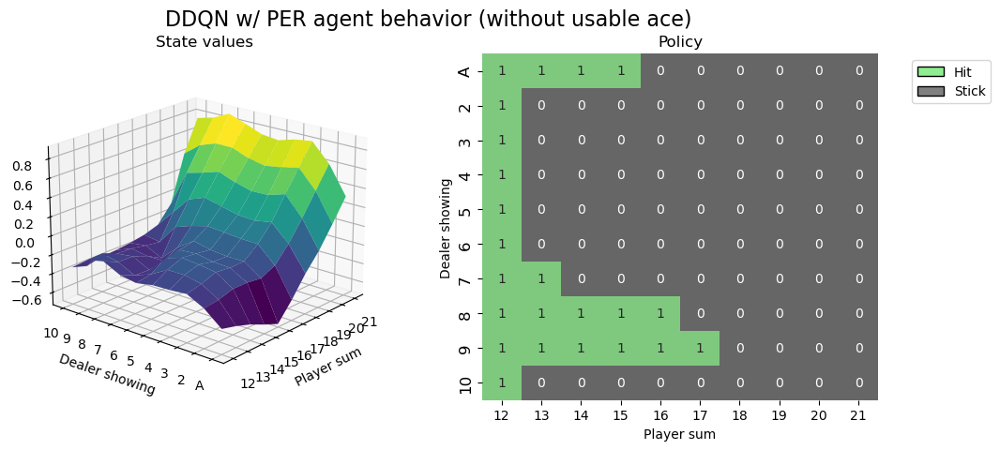

In [89]:
dqn_vis = Visualiser(agent)
dqn_vis.run('DDQN w/ PER agent behavior', usable_ace=True)
dqn_vis.run('DDQN w/ PER agent behavior', usable_ace=False)

# Actor Critic Network

Great resource: [Logic](https://github.com/philtabor/Youtube-Code-Repository/blob/master/ReinforcementLearning/DeepQLearning/) and [main](https://github.com/philtabor/Youtube-Code-Repository/blob/master/ReinforcementLearning/DeepQLearning/) by [Phil Tabor](https://github.com/philtabor/)

### Basic imports

In [53]:
!pip install gymnasium --quiet
import gymnasium as gym
import numpy as np
import time
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np

### Memory Buffer

In [54]:
class ReplayBuffer():
  def __init__(self, max_size, input_shape):
    self.mem_size = max_size
    self.mem_cntr = 0
    self.state_memory = np.zeros((self.mem_size, *input_shape), dtype=np.float32)
    self.new_state_memory = np.zeros((self.mem_size, *input_shape), dtype=np.float32)
    self.log_probs = np.zeros(self.mem_size, dtype=np.float32)
    self.reward_memory = np.zeros(self.mem_size, dtype=np.float32)
    self.terminal_memory = np.zeros(self.mem_size, dtype=bool)

  def store_transition(self, state, log_prob, reward, state_, done):
    index = self.mem_cntr % self.mem_size
    self.state_memory[index] = [s for s in state] # state is a tuple for Blackjack
    self.new_state_memory[index] = [s_ for s_ in state_] # same
    self.log_probs[index]=  log_prob
    self.reward_memory[index] = reward
    self.terminal_memory[index] = done
    self.mem_cntr += 1

  def sample_buffer(self, batch_size):
    max_mem = min(self.mem_cntr, self.mem_size)
    batch = np.random.choice(max_mem, batch_size, replace=False)

    states = self.state_memory[batch]
    probs = self.log_probs[batch]
    rewards = self.reward_memory[batch]
    states_ = self.new_state_memory[batch]
    terminal = self.terminal_memory[batch]

    return states, probs, rewards, states_, terminal

### Actor Critic Network

Another useful [resource](https://github.com/vy007vikas/PyTorch-ActorCriticRL/blob/master/).

In [55]:
class ActorCriticNetwork(nn.Module):
  def __init__(self, lr, input_dims, n_actions):
    super(ActorCriticNetwork, self).__init__()
    self.input_dims = input_dims
    self.n_actions = n_actions
    hidden_dims = 256
    self.fc1 = nn.Linear(*self.input_dims, hidden_dims)
    self.fc2 = nn.Linear(hidden_dims, hidden_dims)
    self.pi = nn.Linear(hidden_dims, n_actions) # probability ditribution of actions per state
    self.v = nn.Linear(hidden_dims, 1) # the value estimation of a state

    self.optimizer = optim.AdamW(self.parameters(), lr=lr)

    self.device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
    self.to(self.device)

  def forward(self, state):
    x = F.relu(self.fc1(state))
    x = F.relu(self.fc2(x))
    pi = self.pi(x)
    v = self.v(x)

    return (v, pi) # return prob. dist. and value of state

### Agent

In [56]:
class Agent:
  def __init__(self, lr, input_dims, n_actions, gamma, batch_size, mem_size):
    self.gamma = gamma
    self.batch_size = batch_size
    self.memory = ReplayBuffer(mem_size, input_dims)
    self.actor_critic = ActorCriticNetwork(lr, input_dims, n_actions)
    self.log_probs = []


  def store_transition(self, state, prob, reward, state_, done):
    self.memory.store_transition(state, prob, reward, state_, done)

  def choose_action(self, observation):
    state = torch.from_numpy(observation).unsqueeze(0).to(self.actor_critic.device)
    with torch.no_grad():
      _, probabilities = self.actor_critic.forward(state)
    # print('probabilities',probabilities)
    # Before changing, 12 May 2024
    probabilities = F.softmax(probabilities, dim=1)
    # probabilities = F.softmax(probabilities) #  produces depr. warning
    action_probs = torch.distributions.Categorical(probabilities)
    action = action_probs.sample()
    log_probs = action_probs.log_prob(action)

    return action.item(), log_probs

  def learn(self):
    if self.memory.mem_cntr < self.batch_size:
      return

    self.actor_critic.optimizer.zero_grad()

    state, prob, reward, new_state, done = \
                                      self.memory.sample_buffer(self.batch_size)
    states = torch.tensor(state).to(self.actor_critic.device)
    probs = torch.tensor(prob).to(self.actor_critic.device)
    rewards = torch.tensor(reward).to(self.actor_critic.device)
    dones = torch.tensor(done).to(self.actor_critic.device)
    states_ = torch.tensor(new_state).to(self.actor_critic.device)

    critic_value_, _ = self.actor_critic.forward(states_)
    critic_value, _ = self.actor_critic.forward(states)

    critic_value_[dones] = 0.
    critic_value_ = torch.squeeze(critic_value_)
    critic_value = torch.squeeze(critic_value)

    delta = rewards + self.gamma * critic_value_
    # delta = torch.squeeze(delta)
    # global FLAG
    # if FLAG:
    #   FLAG = False
    #   # print(f'{rewards=},{critic_value_=}')
    #   print(f'rewards shape {rewards.size()}',
    #         f'critic_value_ shape {critic_value_.size()}')
    actor_loss = -torch.mean(probs*(delta-critic_value))
    critic_loss = F.mse_loss(delta, critic_value)

    (actor_loss + critic_loss).backward()
    self.actor_critic.optimizer.step()


### Train

episode 1/20000 score -1.00 AVGscore -1.00 time taken 19.89 ms avg episode length 2.0
episode 4001/20000 score -1.00 AVGscore -0.28 time taken 2.33 ms avg episode length 1.3
episode 8001/20000 score -1.00 AVGscore -0.46 time taken 3.21 ms avg episode length 1.4
episode 12001/20000 score -1.00 AVGscore -0.44 time taken 2.31 ms avg episode length 1.4
episode 16001/20000 score 1.00 AVGscore -0.48 time taken 2.34 ms avg episode length 1.4
Statistics: wins: 0.28 draws: 0.04 losses: 0.68


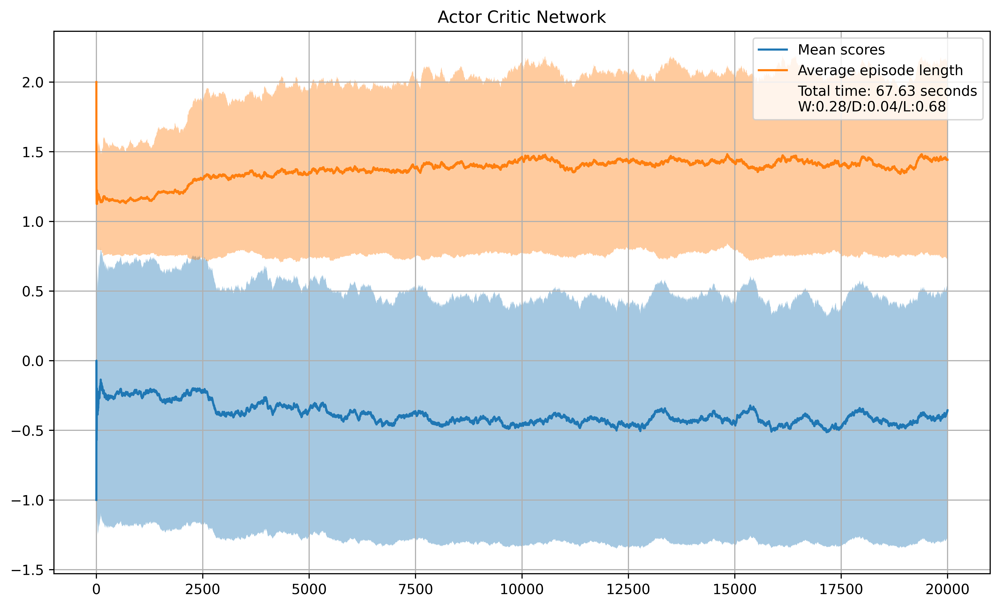

In [57]:
# FLAG = True
env = gym.make('Blackjack-v1')
EPOCHS = 20_000
LR = 1e-3
GAMMA = .98
BATCH_SIZE = 256
MEM_SIZE = 10_000

state, _ = env.reset()

n_actions = env.action_space.n
n_observations = len(state)
agent = Agent(LR, [n_observations], n_actions, GAMMA, BATCH_SIZE, MEM_SIZE)

# keep stats
scores, mean_scores, std_scores, episode_lengths,mean_episode_lengths,std_episode_lengths  = [],[],[],[],[],[]

start_time = time.time()
for i in range(EPOCHS):
  done = False
  observation, _ = env.reset()
  observation = np.array(observation, dtype=np.float32)
  score = 0

  epoch_start_time = time.time()
  episode_length = 0

  while not done:
    episode_length += 1
    action, prob = agent.choose_action(observation)
    observation_, reward, terminated, truncated, info = env.step(action)
    observation_ = np.array(observation_, dtype=np.float32)
    done = terminated or truncated
    score += reward
    agent.store_transition(observation, prob, reward, observation_, done)
    agent.learn()

    observation = observation_

  scores.append(score)
  episode_lengths.append(episode_length)
  mean_episode_lengths.append(np.mean(episode_lengths[-500:]))
  std_episode_lengths.append(np.std(episode_lengths[-500:]))

  mean_scores.append(np.mean(scores[-500:]))
  std_scores.append(np.std(scores[-500:]))
  epoch_time = (time.time() - epoch_start_time) * 1000 # to seconds
  if (i) % (EPOCHS//5) == 0:
    print('episode %d/%d' % (i+1, EPOCHS),
          'score %.2f' % score,
          'AVGscore %.2f' % mean_scores[-1],
          'time taken %.2f ms' % epoch_time,
          'avg episode length %.1f' % mean_episode_lengths[-1])
stats = print_stats(scores)
x = [i+1 for i in range(EPOCHS)]
total_time = (time.time() - start_time)
title='Actor Critic Network'
plot_learning(x, mean_scores, std_scores, mean_episode_lengths, std_episode_lengths, stats, title, total_time)

### Test

episode 1/1000 score -1.00 AVGscore -1.00 time taken 2.19 ms avg episode length 2.0
episode 201/1000 score -1.00 AVGscore -0.47 time taken 0.69 ms avg episode length 1.4
episode 401/1000 score -1.00 AVGscore -0.46 time taken 0.72 ms avg episode length 1.4
episode 601/1000 score -1.00 AVGscore -0.47 time taken 1.35 ms avg episode length 1.4
episode 801/1000 score 1.00 AVGscore -0.46 time taken 1.05 ms avg episode length 1.4
Statistics: wins: 0.26 draws: 0.04 losses: 0.71


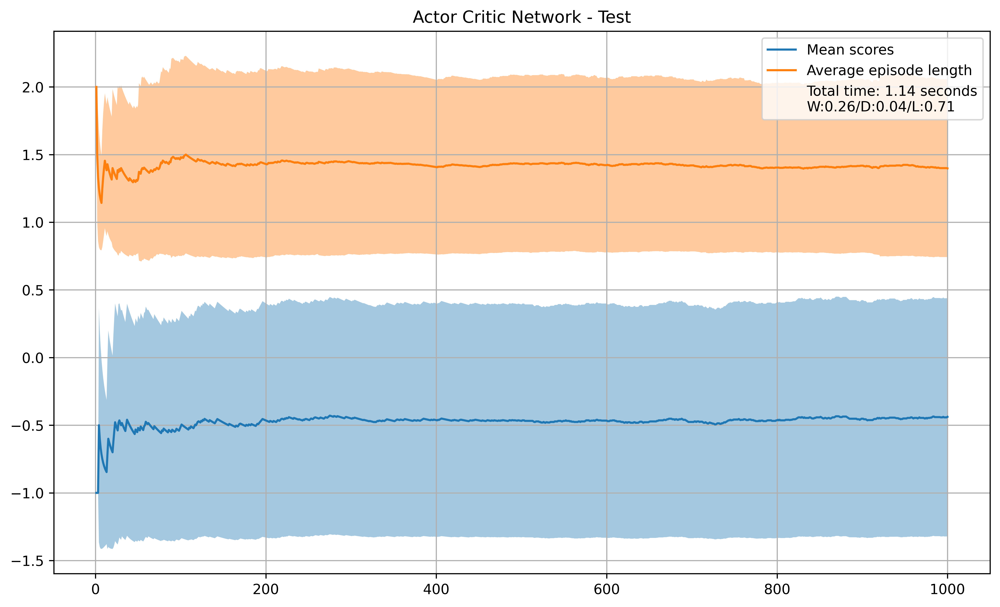

In [58]:
# FLAG = True
env = gym.make('Blackjack-v1')
EPOCHS = 1_000
LR = 1e-3
GAMMA = .98
BATCH_SIZE = 256
MEM_SIZE = 10_000

state, _ = env.reset()

n_actions = env.action_space.n
n_observations = len(state)
# agent = Agent(LR, [n_observations], n_actions, GAMMA, BATCH_SIZE, MEM_SIZE)

# keep stats
scores, mean_scores, std_scores, episode_lengths,mean_episode_lengths,std_episode_lengths  = [],[],[],[],[],[]

start_time = time.time()
for i in range(EPOCHS):
  done = False
  observation, _ = env.reset()
  observation = np.array(observation, dtype=np.float32)
  score = 0

  epoch_start_time = time.time()
  episode_length = 0

  while not done:
    episode_length += 1
    action, prob = agent.choose_action(observation)
    observation_, reward, terminated, truncated, info = env.step(action)
    observation_ = np.array(observation_, dtype=np.float32)
    done = terminated or truncated
    score += reward
    # agent.store_transition(observation, prob, reward, observation_, done)
    # agent.learn()

    observation = observation_

  scores.append(score)
  episode_lengths.append(episode_length)
  mean_episode_lengths.append(np.mean(episode_lengths[-500:]))
  std_episode_lengths.append(np.std(episode_lengths[-500:]))

  mean_scores.append(np.mean(scores[-500:]))
  std_scores.append(np.std(scores[-500:]))
  epoch_time = (time.time() - epoch_start_time) * 1000 # to seconds
  if (i) % (EPOCHS//5) == 0:
    print('episode %d/%d' % (i+1, EPOCHS),
          'score %.2f' % score,
          'AVGscore %.2f' % mean_scores[-1],
          'time taken %.2f ms' % epoch_time,
          'avg episode length %.1f' % mean_episode_lengths[-1])
stats = print_stats(scores)
x = [i+1 for i in range(EPOCHS)]
total_time = (time.time() - start_time)
title='Actor Critic Network - Test'
plot_learning(x, mean_scores, std_scores, mean_episode_lengths, std_episode_lengths, stats, title, total_time)

### Custom visualiser

In [63]:
!pip install seaborn --quiet
import seaborn as sns
from collections import defaultdict
from matplotlib.patches import Patch
class VisualiserActorCritic:
  def __init__(self, agent):
    # state = torch.from_numpy(observation).unsqueeze(0).to(agent.policy_net.device)
    # with torch.no_grad():
    #   actions = self.policy_net.forward(state)
    # action = torch.argmax(actions).item()

    # observations, actions = [],[]
    # self.observations = np.unique(agent.memory.state_memory, axis=0) # old way
    # might not cover all possibilities
    ALL_POSSIBLE_OBSERVATIONS = []
    for i in range(4,22):
      for j in range(1,11):
        # for k in range(0,2):
          k=0
          ALL_POSSIBLE_OBSERVATIONS.append([i,j,k])
          if i>11:
            ALL_POSSIBLE_OBSERVATIONS.append([i,j,k+1])
    ALL_POSSIBLE_OBSERVATIONS = np.array(ALL_POSSIBLE_OBSERVATIONS,dtype=np.float32)
    self.observations = ALL_POSSIBLE_OBSERVATIONS
    # self.obs_tuples = tuple(map(tuple, np.array(observations, dtype=np.int16)))
    self.state_values_dict = defaultdict(float)
    self.obs_tuple_dict = defaultdict(lambda: np.full((1,2), 0))
    for obs in self.observations:
      state = torch.from_numpy(obs).unsqueeze(0).to(agent.actor_critic.device)
      with torch.no_grad():
        value, actions = agent.actor_critic.forward(state)
      # action = torch.argmax(actions).item()
      obs_tuple = tuple(np.array(obs, dtype=np.int8))

      self.obs_tuple_dict[obs_tuple] = actions.cpu().numpy()
      self.state_values_dict[obs_tuple] = value.cpu().numpy()
      # print(value)
    # print(self.obs_tuple_dict)

  def create_grids(self, usable_ace=True, ):
    """Create value and policy grid given an agent."""
    # convert our state-action values to state values
    # and build a policy dictionary that maps observations to actions
    state_value = defaultdict(float)
    policy = defaultdict(int)
    for obs, action_values in self.obs_tuple_dict.items():
        # state_value[obs] = float(np.max(action_values))
        # policy[obs] = int(np.argmax(action_values))
        state_value[obs] = np.squeeze(self.state_values_dict[obs])
        # print(obs, action_values)
        action_values = np.squeeze(action_values) # remove outer dimensions
        policy[obs] = int(np.argmax(action_values))

    player_count, dealer_count = np.meshgrid(
        # players count, dealers face-up card
        np.arange(12, 22),
        np.arange(1, 11),
    )

    # create the value grid for plotting
    value = np.apply_along_axis(
        lambda obs: state_value[(obs[0], obs[1], usable_ace)],
        axis=2,
        arr=np.dstack([player_count, dealer_count]),
    )
    value_grid = player_count, dealer_count, value

    # create the policy grid for plotting
    policy_grid = np.apply_along_axis(
        lambda obs: policy[(obs[0], obs[1], usable_ace)],
        axis=2,
        arr=np.dstack([player_count, dealer_count]),
    )
    return value_grid, policy_grid


  def create_plots(self,value_grid, policy_grid, title: str):
    """Creates a plot using a value and policy grid."""
    # create a new figure with 2 subplots (left: state values, right: policy)
    player_count, dealer_count, value = value_grid
    fig = plt.figure(figsize=plt.figaspect(0.4))
    fig.suptitle(title, fontsize=16)

    # plot the state values
    ax1 = fig.add_subplot(1, 2, 1, projection="3d")
    ax1.plot_surface(
        player_count,
        dealer_count,
        value,
        rstride=1,
        cstride=1,
        cmap="viridis",
        edgecolor="none",
    )
    plt.xticks(range(12, 22), range(12, 22))
    plt.yticks(range(1, 11), ["A"] + list(range(2, 11)))
    ax1.set_title(f"State values")
    ax1.set_xlabel("Player sum")
    ax1.set_ylabel("Dealer showing")
    ax1.zaxis.set_rotate_label(False)
    ax1.set_zlabel("Value", fontsize=14, rotation=90)
    ax1.view_init(20, 220)

    # plot the policy
    fig.add_subplot(1, 2, 2)
    ax2 = sns.heatmap(policy_grid, linewidth=0, annot=True, cmap="Accent_r", cbar=False)
    ax2.set_title(f"Policy")
    ax2.set_xlabel("Player sum")
    ax2.set_ylabel("Dealer showing")
    ax2.set_xticklabels(range(12, 22))
    ax2.set_yticklabels(["A"] + list(range(2, 11)), fontsize=12)

    # add a legend
    legend_elements = [
        Patch(facecolor="lightgreen", edgecolor="black", label="Hit"),
        Patch(facecolor="grey", edgecolor="black", label="Stick"),
    ]
    ax2.legend(handles=legend_elements, bbox_to_anchor=(1.3, 1))
    return fig

  def run(self, title=None, usable_ace=True):
    # state values & policy with usable ace (ace counts as 11)
    value_grid, policy_grid = self.create_grids(usable_ace)
    title = 'Agent behavior' if title is None else title
    title += ' (with usable ace)' if usable_ace else ' (without usable ace)'
    fig1 = self.create_plots(value_grid, policy_grid, title=title)
    plt.show()


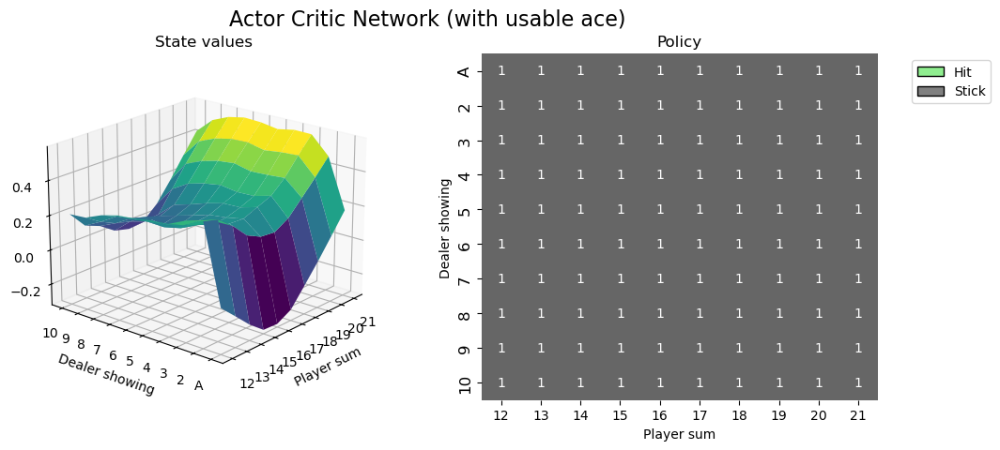

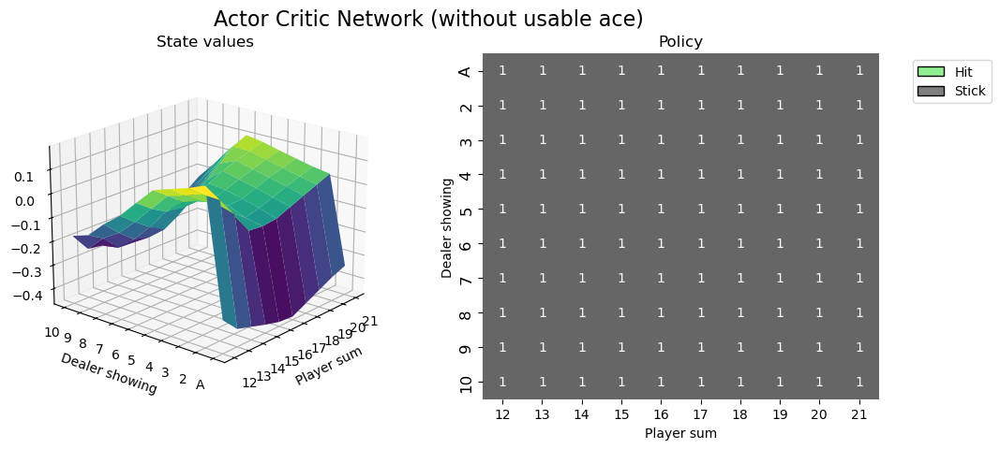

In [64]:
vis = VisualiserActorCritic(agent)
vis.run('Actor Critic Network', usable_ace=True)
vis.run('Actor Critic Network', usable_ace=False)

# CNN and DDQN

### Imports

In [102]:
# First let's deal with our imports
# !pip install gymnasium --quiet
!pip install gymnasium[toy-text] --quiet
import gymnasium as gym
import torch
from torch import nn
from torch.nn import functional as F
from torch import optim
import numpy as np
import matplotlib.pyplot as plt
import time

### Define our brains

In [103]:
class DQN(nn.Module):
  def __init__(self, input_dims, n_actions, lr=1e-3):
    super(DQN, self).__init__()
    self.input_dims = input_dims
    self.n_actions = n_actions
    # This will probably not work
    self.conv1 = nn.Conv2d(3, 16, 3)
    self.pool = nn.MaxPool2d(3, 3)
    self.conv2 = nn.Conv2d(16, 8, 3)
    self.conv3 = nn.Conv2d(8, 4, 3)
    self.fc1 = nn.Linear(1428, 128)
    self.fc2 = nn.Linear(128, 64)
    self.fc3 = nn.Linear(64, n_actions)

    self.optimizer = optim.AdamW(self.parameters(), lr=lr, )
    self.loss = nn.MSELoss()
    self.device = 'cuda' if torch.cuda.is_available() else 'cpu'
    self.to(self.device)

  def forward(self, state):
    x = self.pool(F.relu(self.conv1(state)))
    x = self.pool(F.relu(self.conv2(x)))
    x = self.pool(F.relu(self.conv3(x)))
    # print(x.shape)
    x = torch.flatten(x, 1)
    x = F.relu(self.fc1(x))
    x = F.relu(self.fc2(x))
    actions = self.fc3(x)
    # print(actions)
    return actions


### Define a Memory Buffer

In [104]:
class ReplayBuffer:
  def __init__(self, mem_size, n_states, n_actions):
    self.mem_size = mem_size
    self.states = np.zeros((self.mem_size, *n_states), dtype=np.float32)
    self.new_states = np.zeros((self.mem_size, *n_states), dtype=np.float32)
    self.rewards = np.zeros(self.mem_size, dtype=np.float32)
    self.actions = np.zeros(self.mem_size, dtype=np.int8)
    self.dones = np.zeros(self.mem_size, np.bool_)
    self.mem_cntr = 0

  def store_transition(self, state, action, reward, new_state, done):
    index = self.mem_cntr % self.mem_size
    self.states[index] = np.array([s for s in state]) # for Blackjack we have a tuple as a state
    self.new_states[index] = np.array([s for s in new_state])
    self.rewards[index] = reward
    self.actions[index] = action
    self.dones[index] = done

    self.mem_cntr += 1

  def sample(self, batch_size):
    total = min(self.mem_cntr, self.mem_size)
    indices = np.random.choice(total, batch_size, replace=False)
    return self.states[indices], self.actions[indices], self.rewards[indices], self.new_states[indices], self.dones[indices]

  def __len__(self):
    return min(self.mem_cntr, self.mem_size)

### Define the Agent

In [105]:
class Agent:
  def __init__(self, n_observations, n_actions, lr, gamma,
               batch_size, tau, epsilon, eps_dec, eps_min, mem_size):
    self.lr = lr
    self.batch_size = batch_size
    self.n_observations = n_observations
    self.n_actions = n_actions
    self.tau = tau
    self.epsilon = epsilon
    self.eps_dec = eps_dec
    self.eps_min = eps_min
    self.gamma = gamma

    self.policy_net = DQN(n_observations, n_actions, lr)
    self.target_net = DQN(n_observations, n_actions, lr)
    # deep copy
    self.target_net.load_state_dict(self.policy_net.state_dict())
    self.mem_size = mem_size
    self.memory = ReplayBuffer(self.mem_size, self.n_observations, self.n_actions)

    self.iter_cntr = 0

  def choose_action(self, observation):
    if np.random.random() > self.epsilon:
      state = observation.unsqueeze(0).to(self.policy_net.device)
      actions = self.policy_net.forward(state)
      action = torch.argmax(actions).item() # get the position of the most probable action
      return action
    else:
      return np.random.choice(self.n_actions) # POSSIBLE PROBLEM. PROBABLY NOT

  def store_transition(self, state, action, reward, new_state, done):
    self.memory.store_transition(state, action, reward, new_state, done)

  def decay_eps(self):
    self.epsilon = self.epsilon - self.eps_dec if self.epsilon > self.eps_min else self.eps_min

  def learn(self):
    if self.memory.mem_cntr < self.batch_size:
      return

    states, actions, rewards, new_states, dones = self.memory.sample(self.batch_size)

    states = torch.tensor(states).to(self.policy_net.device)
    # actions = torch.tensor(actions).to(self.policy_net.device) # not needed
    rewards = torch.tensor(rewards).to(self.policy_net.device)
    new_states = torch.tensor(new_states).to(self.policy_net.device)
    dones = torch.tensor(dones).to(self.policy_net.device)

    batch_index = np.arange(self.batch_size) # create an array to index the network

    # print('actions:', actions)

    q = self.policy_net.forward(states)[batch_index, actions]
    # print('q:', q)

    q_next = self.target_net.forward(new_states)
    q_next[dones] = 0. # nullify next states if they were terminal states

    q_target = rewards + self.gamma * q_next.max(dim=1).values
    # print('q_target:', q_target)

    # print('q_target:', q_target.size(),'q:', q.size())

    self.policy_net.optimizer.zero_grad()
    loss = self.policy_net.loss(q_target, q).to(self.policy_net.device)
    loss.backward()
    self.policy_net.optimizer.step()

    p_state_dict = self.policy_net.state_dict()
    t_state_dict = self.target_net.state_dict()
    for key in p_state_dict:
      t_state_dict[key] = p_state_dict[key] * self.tau + \
        t_state_dict[key] * (1-self.tau)
    self.target_net.load_state_dict(t_state_dict)

    self.iter_cntr += 1
    self.decay_eps() # subtract some small value from epsilon (exploit vs explore)

### Other

### Trainer with CNN

episode    1/2000 AVGscore -1.00 epsilon 1.000 time taken 0.03 ms avg episode length 1.0
episode  201/2000 AVGscore -0.39 epsilon 0.277 time taken 0.16 ms avg episode length 1.4
episode  401/2000 AVGscore -0.25 epsilon 0.007 time taken 0.16 ms avg episode length 1.3
episode  601/2000 AVGscore -0.09 epsilon 0.007 time taken 0.16 ms avg episode length 1.4
episode  801/2000 AVGscore -0.10 epsilon 0.007 time taken 0.16 ms avg episode length 1.5
episode 1001/2000 AVGscore -0.02 epsilon 0.007 time taken 0.33 ms avg episode length 1.5
episode 1201/2000 AVGscore -0.04 epsilon 0.007 time taken 0.67 ms avg episode length 1.5
episode 1401/2000 AVGscore -0.08 epsilon 0.007 time taken 0.16 ms avg episode length 1.4
episode 1601/2000 AVGscore -0.09 epsilon 0.007 time taken 0.33 ms avg episode length 1.4
episode 1801/2000 AVGscore -0.02 epsilon 0.007 time taken 0.16 ms avg episode length 1.6
Statistics: wins: 0.42 draws: 0.08 losses: 0.51


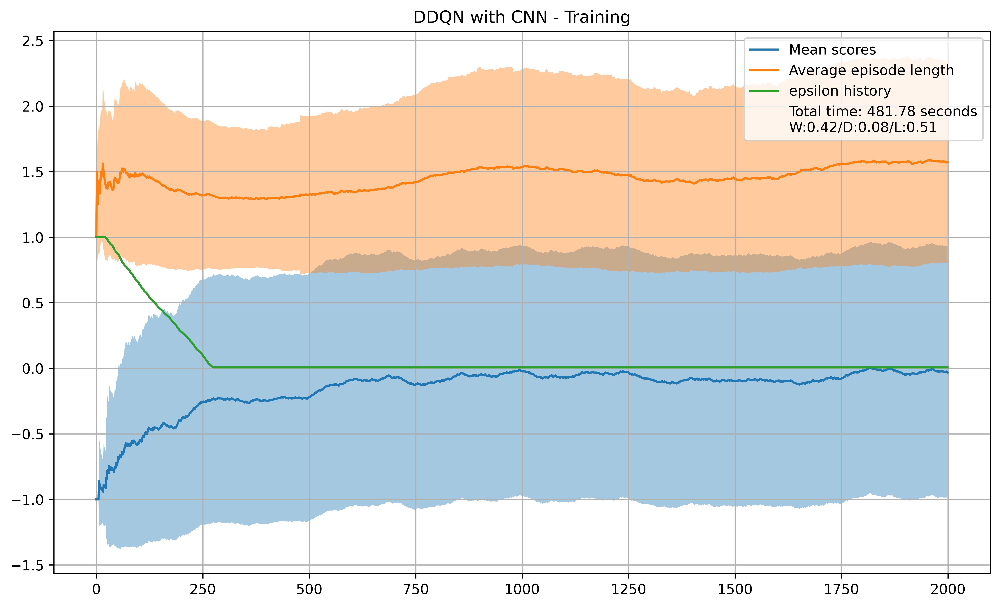

In [106]:
env = gym.make('Blackjack-v1', render_mode='rgb_array')
state, _ = env.reset()
device = 'cuda' if torch.cuda.is_available else 'cpu'
# frame = env.render()
n_states = torch.tensor(env.render()).permute(2, 0, 1).size()
# dqn = DQN(n_states, n_actions)
# dqn(frame)
n_actions = env.action_space.n
LR = 1e-3
GAMMA = .8
TAU = 1e-3
EPSILON = 1.
EPS_DEC = 3e-3
EPS_MIN = 7e-3
MEM_SIZE = 256
BATCH_SIZE = 32
EPOCHS = 2_000
agent = Agent([*n_states], n_actions, LR, GAMMA,
              BATCH_SIZE, TAU, EPSILON, EPS_DEC, EPS_MIN, MEM_SIZE)
#  frame = env.render() / 255.

scores, mean_scores, std_scores, eps_history, episode_lengths, \
mean_ep_lengths, std_ep_lengths = \
[],[],[],[],[],[],[]

start_time = time.time()

for epoch in range(EPOCHS):
  epoch_start_time = time.time()
  score = 0
  done = False
  iters = 0
  observation, _ = env.reset()
  observation = env.render() / 255.
  observation = torch.tensor(observation).type(torch.float).permute(2, 0, 1).to(device)
  while not done:
    iters += 1

    action = agent.choose_action(observation)
    observation_, reward, terminated, truncated, _ = env.step(action)
    observation_ = env.render() / 255.
    observation_ = torch.tensor(observation_).type(torch.float).permute(2, 0, 1).to(device)
    score += reward
    done = terminated or truncated
    agent.store_transition(observation.cpu(), action, reward, observation_.cpu(), done)
    agent.learn()

    observation = observation_



  epoch_time = time.time() - epoch_start_time
  eps_history.append(agent.epsilon)
  scores.append(score)
  episode_lengths.append(iters)
  mean_scores.append(np.mean(scores[-500:]))
  std_scores.append(np.std(scores[-500:]))
  mean_ep_lengths.append(np.mean(episode_lengths[-500:]))
  std_ep_lengths.append(np.std(episode_lengths[-500:]))
  if epoch % 200 == 0:
    print('episode %4d/%4d' % (epoch+1, EPOCHS),
          # 'score %.2f' % score,
          'AVGscore %.2f' % mean_scores[-1],
          'epsilon %.3f' % agent.epsilon,
          'time taken %.2f ms' % epoch_time,
          'avg episode length %.1f' % mean_ep_lengths[-1])
stats = print_stats(scores)

x = [i for i in range(EPOCHS)]
mean_scores = np.array(mean_scores)
std_scores = np.array(std_scores)
mean_ep_lengths = np.array(mean_ep_lengths)
std_ep_lengths = np.array(std_ep_lengths)
total_time = time.time() - start_time
title = 'DDQN with CNN - Training'
plot_learning(x, mean_scores, std_scores, mean_ep_lengths, std_ep_lengths, stats, title, total_time, eps_history)

### Test with CNN

episode    1/2000 AVGscore -1.00 epsilon 0.007 time taken 0.02 ms avg episode length 1.0
episode  201/2000 AVGscore 0.00 epsilon 0.007 time taken 0.03 ms avg episode length 1.5
episode  401/2000 AVGscore -0.04 epsilon 0.007 time taken 0.02 ms avg episode length 1.5
episode  601/2000 AVGscore -0.08 epsilon 0.007 time taken 0.04 ms avg episode length 1.5
episode  801/2000 AVGscore -0.15 epsilon 0.007 time taken 0.02 ms avg episode length 1.5
episode 1001/2000 AVGscore -0.07 epsilon 0.007 time taken 0.02 ms avg episode length 1.5
episode 1201/2000 AVGscore -0.10 epsilon 0.007 time taken 0.04 ms avg episode length 1.5
episode 1401/2000 AVGscore -0.12 epsilon 0.007 time taken 0.03 ms avg episode length 1.4
episode 1601/2000 AVGscore -0.16 epsilon 0.007 time taken 0.04 ms avg episode length 1.5
episode 1801/2000 AVGscore -0.15 epsilon 0.007 time taken 0.02 ms avg episode length 1.5
Statistics: wins: 0.41 draws: 0.07 losses: 0.51


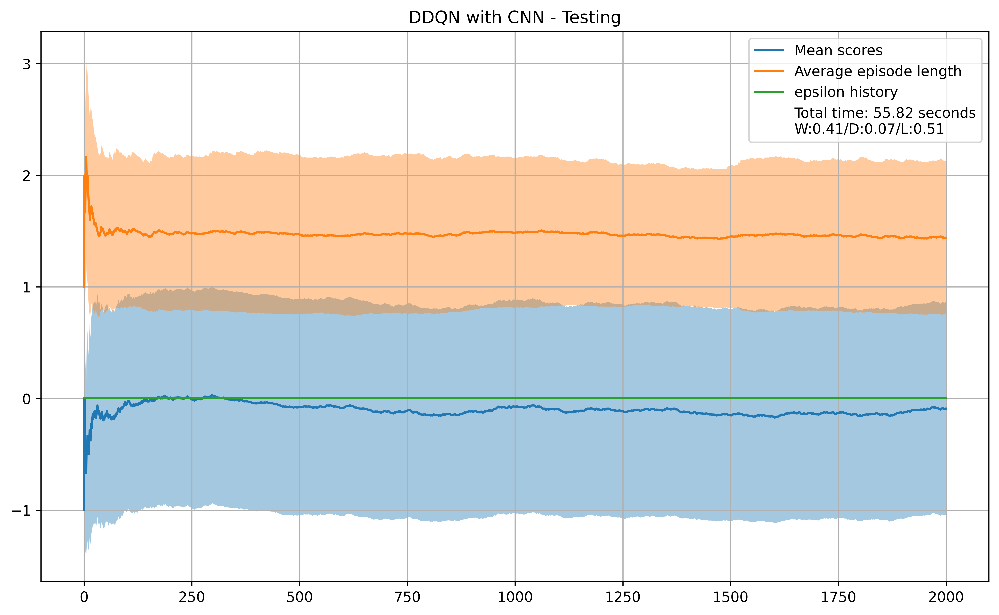

In [107]:
env = gym.make('Blackjack-v1', render_mode='rgb_array')
state, _ = env.reset()
device = 'cuda' if torch.cuda.is_available else 'cpu'
# frame = env.render()
n_states = torch.tensor(env.render()).permute(2, 0, 1).size()
# dqn = DQN(n_states, n_actions)
# dqn(frame)
n_actions = env.action_space.n
LR = 1e-3
GAMMA = .8
TAU = 1e-3
EPSILON = 1.
EPS_DEC = 3e-3
EPS_MIN = 7e-3
MEM_SIZE = 256
BATCH_SIZE = 32
EPOCHS = 2_000
# agent = Agent([*n_states], n_actions, LR, GAMMA,
#               BATCH_SIZE, TAU, EPSILON, EPS_DEC, EPS_MIN, MEM_SIZE)
#  frame = env.render() / 255.

scores, mean_scores, std_scores, eps_history, episode_lengths, \
mean_ep_lengths, std_ep_lengths = \
[],[],[],[],[],[],[]

start_time = time.time()

for epoch in range(EPOCHS):
  epoch_start_time = time.time()
  score = 0
  done = False
  iters = 0
  observation, _ = env.reset()
  observation = env.render() / 255.
  observation = torch.tensor(observation).type(torch.float).permute(2, 0, 1).to(device)
  while not done:
    iters += 1

    action = agent.choose_action(observation)
    observation_, reward, terminated, truncated, _ = env.step(action)
    observation_ = env.render() / 255.
    observation_ = torch.tensor(observation_).type(torch.float).permute(2, 0, 1).to(device)
    score += reward
    done = terminated or truncated
    # agent.store_transition(observation.cpu(), action, reward, observation_.cpu(), done)
    # agent.learn()

    observation = observation_



  epoch_time = time.time() - epoch_start_time
  eps_history.append(agent.epsilon)
  scores.append(score)
  episode_lengths.append(iters)
  mean_scores.append(np.mean(scores[-500:]))
  std_scores.append(np.std(scores[-500:]))
  mean_ep_lengths.append(np.mean(episode_lengths[-500:]))
  std_ep_lengths.append(np.std(episode_lengths[-500:]))
  if epoch % 200 == 0:
    print('episode %4d/%4d' % (epoch+1, EPOCHS),
          # 'score %.2f' % score,
          'AVGscore %.2f' % mean_scores[-1],
          'epsilon %.3f' % agent.epsilon,
          'time taken %.2f ms' % epoch_time,
          'avg episode length %.1f' % mean_ep_lengths[-1])
stats = print_stats(scores)

x = [i for i in range(EPOCHS)]
mean_scores = np.array(mean_scores)
std_scores = np.array(std_scores)
mean_ep_lengths = np.array(mean_ep_lengths)
std_ep_lengths = np.array(std_ep_lengths)
total_time = time.time() - start_time
title = 'DDQN with CNN - Testing'
plot_learning(x, mean_scores, std_scores, mean_ep_lengths, std_ep_lengths, stats, title, total_time, eps_history)